In [1]:
#use wdtools_env_pip environment

import numpy as np
from math import log10, floor
from bisect import bisect_left
from scipy import stats
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors
plt.style.use('Software/stefan.mplstyle')

import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'

#for machine learning
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import load_model


# This notebook trains a machine learning method to reconstruct the correlation length in the simulation with dust effected added (simulation=2)
- Use a deep learning approach with a convolutional neural network. CNNs are designed to automatically learn hierarchical features from raw data (usually images), so they are well suited to detect the peak/drop-off structure in the Moran's I x Z-Score curve that is useful in identifying the correlation length without me needing to do manual feature extraction. 
    - Use just the 1D Moran's I x Z-Score curve, don't include the distance array since the CNN will learn that scale from the labeled true correlation length
    - Don't cut the peak at small distances since the CNN should learn that feature doesn't necessarily drive the labeled true correlation length

# Import the simulation outputs

In [2]:
def get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type,nonzero_weight_cut=20,plot=True):
    #read back in measurements
    noise_label="".join(noise_effect_array)
    
    #sample_type='training','testing', or 'bootstrap'
    if sample_type=='training':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']
        
    if sample_type=='testing':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']

    Ws = npzfile['Ws']
    final_distances = npzfile['distances']
    moransIs = npzfile['moransIs'] 
    expectations = npzfile['expectations']
    variances = npzfile['variances']
    zscores = npzfile['zscores']
    
    mult=[]
    for i in range(len(moransIs)):
        mult.append(moransIs[i]*zscores[i])
        
    #cut to make sure have enough nonzero weights for valid results
    index = bisect_left(Ws, nonzero_weight_cut)
    
    if plot:
        #plot
        fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(6,15),sharex=True)
        ax1.plot(final_distances,moransIs)
        ax1.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax1.axvline(corr_length,color='green',label='True Correlation\nLength')
        ax1.axhline(expectations[0],color='red',label='No Correlation')
        ax1.set_ylabel("Moran's I")
        ax1.legend()

        ax2.plot(final_distances,zscores)
        ax2.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax2.axvline(corr_length,color='green')
        ax2.set_ylabel('Z-score')

        ax3.plot(final_distances,mult)
        ax3.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax3.axvline(corr_length,color='green')
        ax3.set_xlabel('Distance Cut')
        ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

        plt.subplots_adjust(wspace = 0,hspace=0)
        plt.show()
    
    return(final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index)


In [3]:
def count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type):
    
    #turn into combined simulation parameter array
    simulation_params=[]
    for corr_length in corr_lengths:
        for epsilon in epsilons:
            simulation_params.append([corr_length,epsilon])
            
    noise_label="".join(noise_effect_array)
    
    simulation_params_not_run=[]
    simulation_params_run=[]
    
    #check if each training data simulation has been run
    for i in range(len(simulation_params)):
        simulation=simulation_params[i]
        corr_length=simulation[0]
        epsilon=simulation[1]
        try:
            if sample_type=='training':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            if sample_type=='testing':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            simulation_params_run.append(simulation)
            #print('Simulation exists, ', simulation)
        except:
            simulation_params_not_run.append(simulation)
            #print('No simulation exists, ', simulation)

    return(simulation_params_run,simulation_params_not_run)


In [4]:
#for training data
corr_lengths=np.round(np.append(np.linspace(1,98,30)[1:],np.logspace(2,3,num=100)[1:-1]),2)
def round_sig(x,sig):
    return round(x, sig-int(floor(log10(abs(x))))-1)
epsilons_init=np.append(np.logspace(-10,-1,num=20),np.linspace(0.1,0.5,4)[1:])
epsilons=[]
for e in epsilons_init:
    epsilons.append(round_sig(e,2))

#for testing data
corr_lengths_testing=[10,25,50,75,100,150,200,250,300,400,500,600,700,800,900,1000]
epsilons_testing=[1e-10,1e-7,1e-4,0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [5]:
sample_size=10207
noise_effect_array=['0','1','0','0','0']
improvement_factor=1
effect_strength=1
chance_companion=0.01
remove_likely_binaries='0'

#count how many simulations have been run

simulation_params_run,simulation_params_not_run=count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

print('training')
print(len(simulation_params_run))
print(len(simulation_params_not_run))
print('')

simulation_params_run_testing,simulation_params_not_run_testing=count_simulations(corr_lengths_testing,epsilons_testing,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'testing')
print('testing')
print(len(simulation_params_run_testing))
print(len(simulation_params_not_run_testing))

training
2921
0

testing
256
0


572.24 0.034


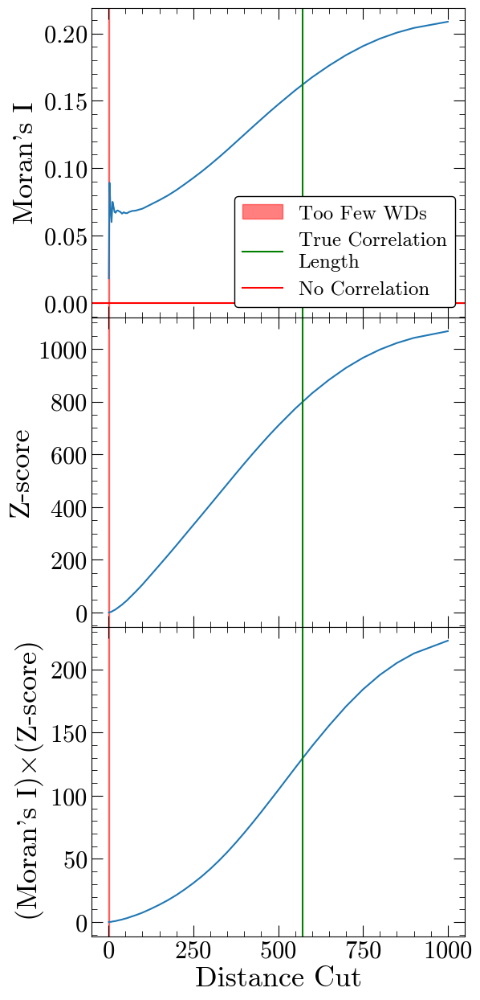

312.57 0.1


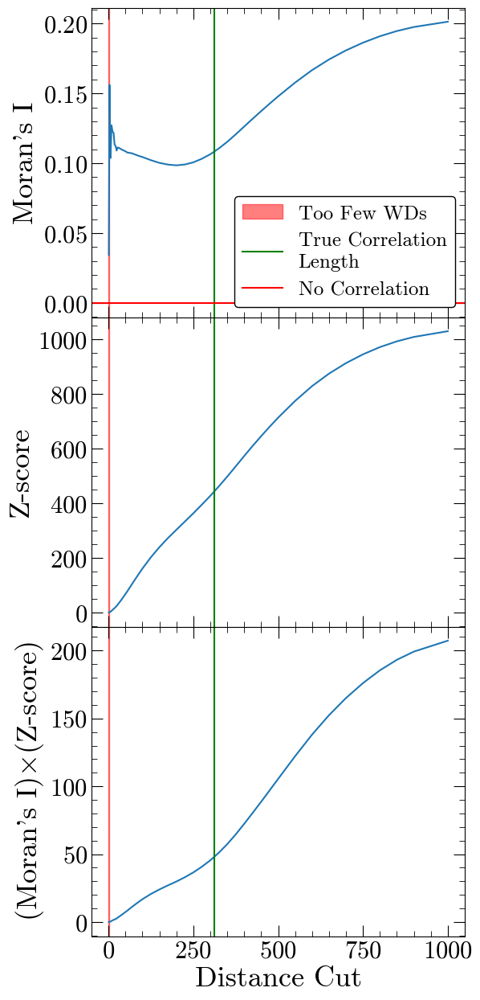

200.92 1.6e-05


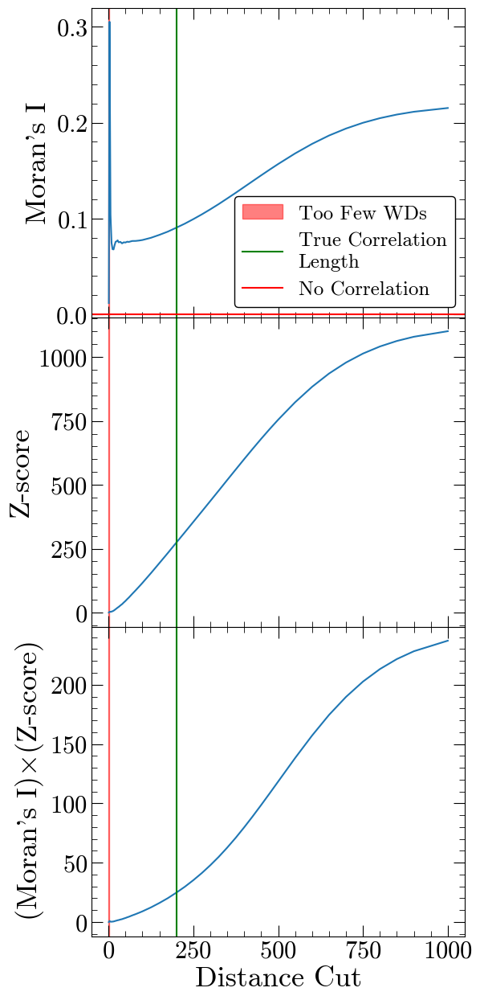

44.48 7.8e-09


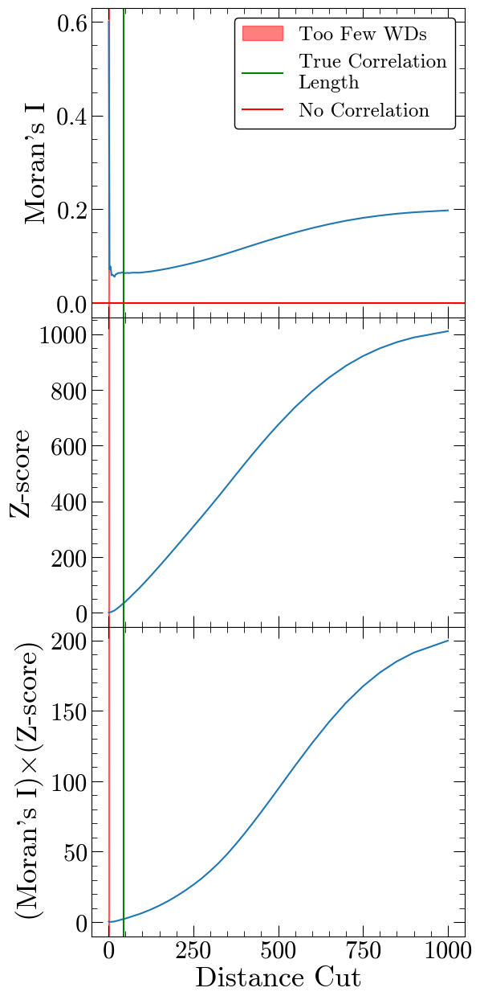

830.22 0.0038


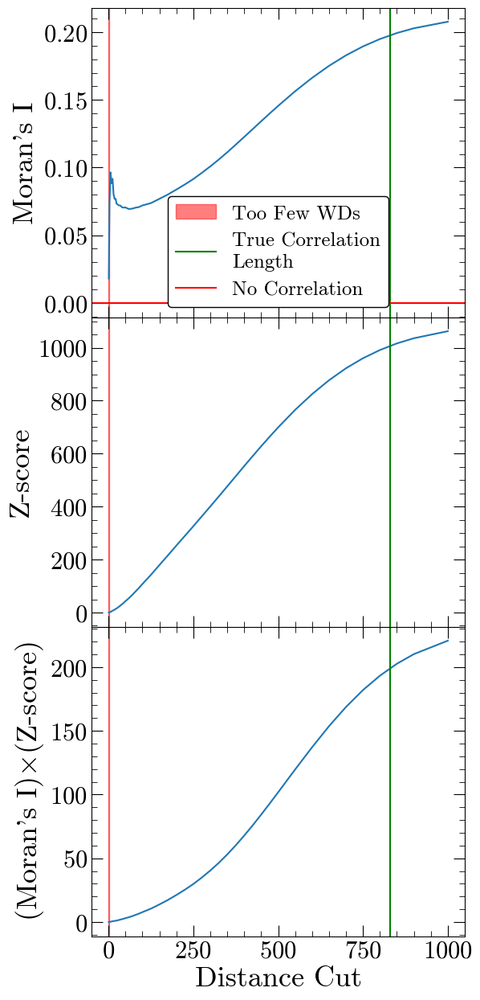

170.74 4.8e-05


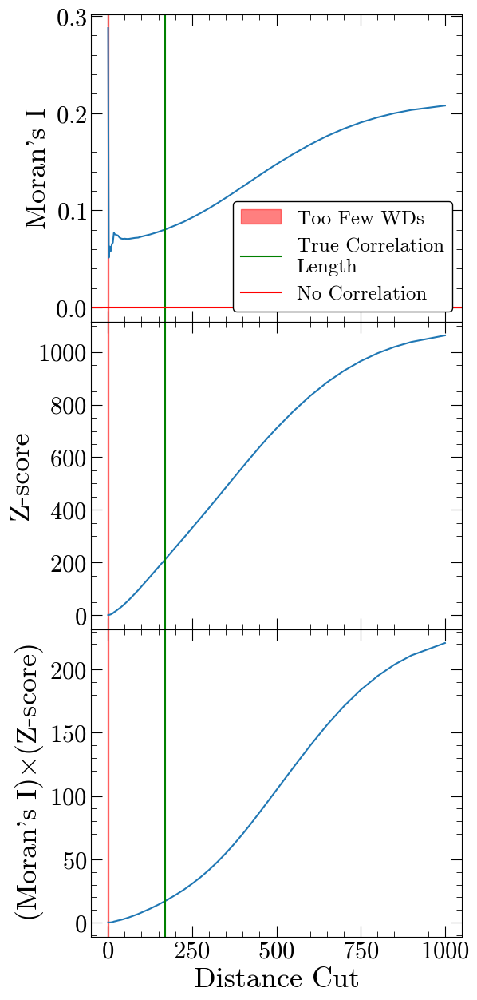

464.16 0.5


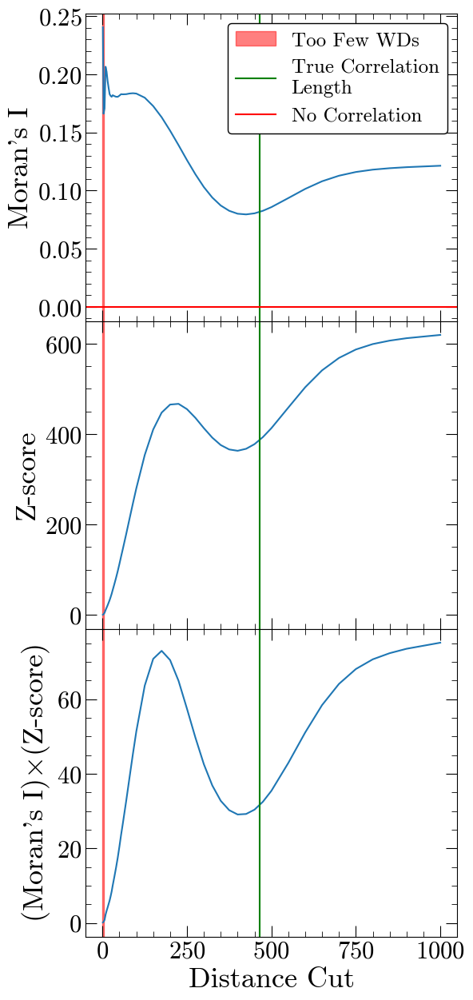

497.7 0.0038


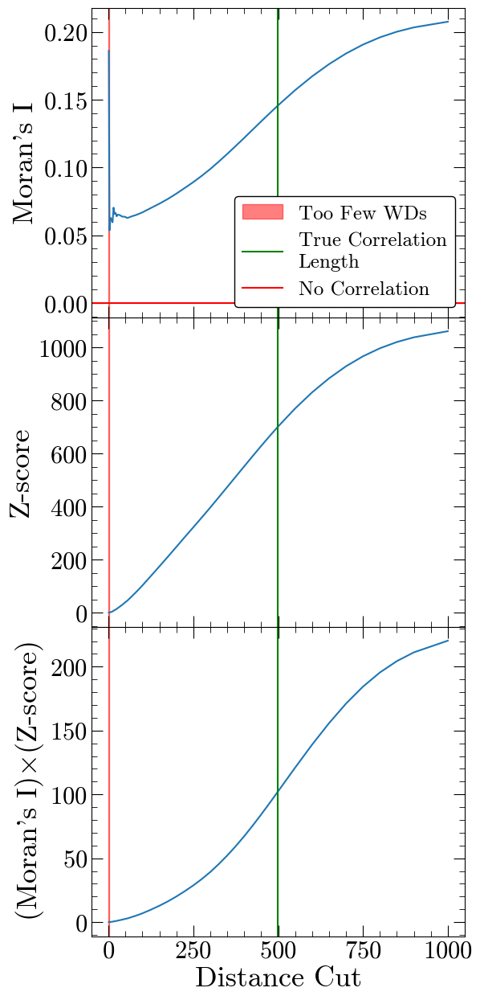

849.75 5.5e-06


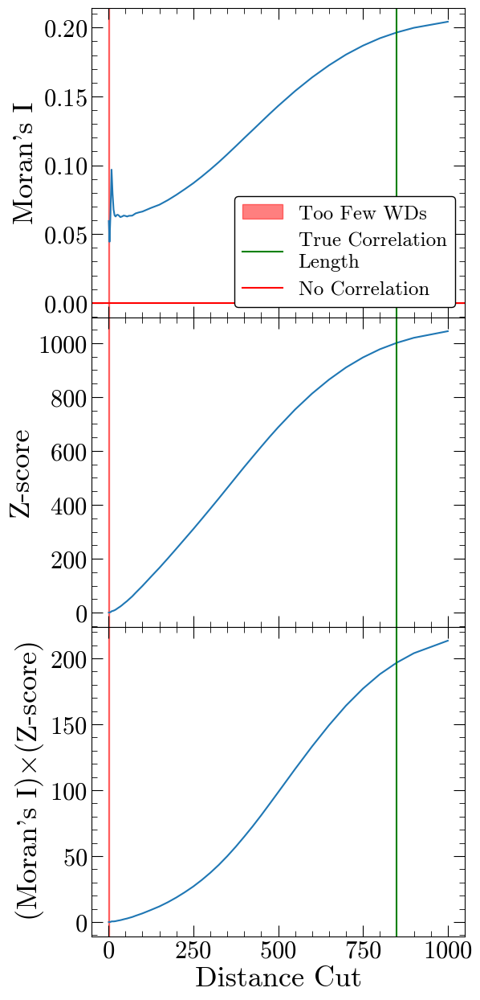

77.93 6.2e-07


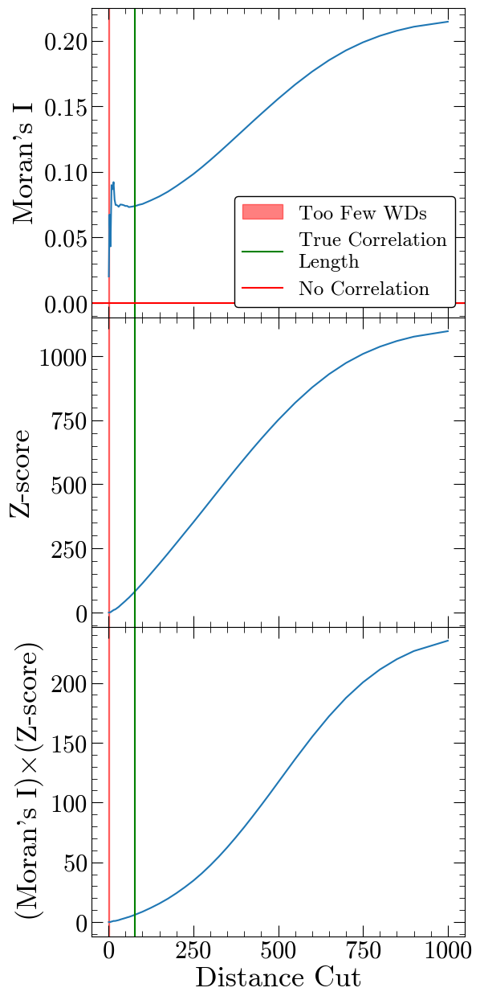

In [6]:
#display a few curves from the training data set
indices=np.random.randint(len(simulation_params_run), size=10)
for index in indices:
    corr_length=simulation_params_run[index][0]
    epsilon=simulation_params_run[index][1]
    print(corr_length,epsilon)
    sample_size=10207
    output=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

# Make a representative plot of various epsilons and correlation lengths

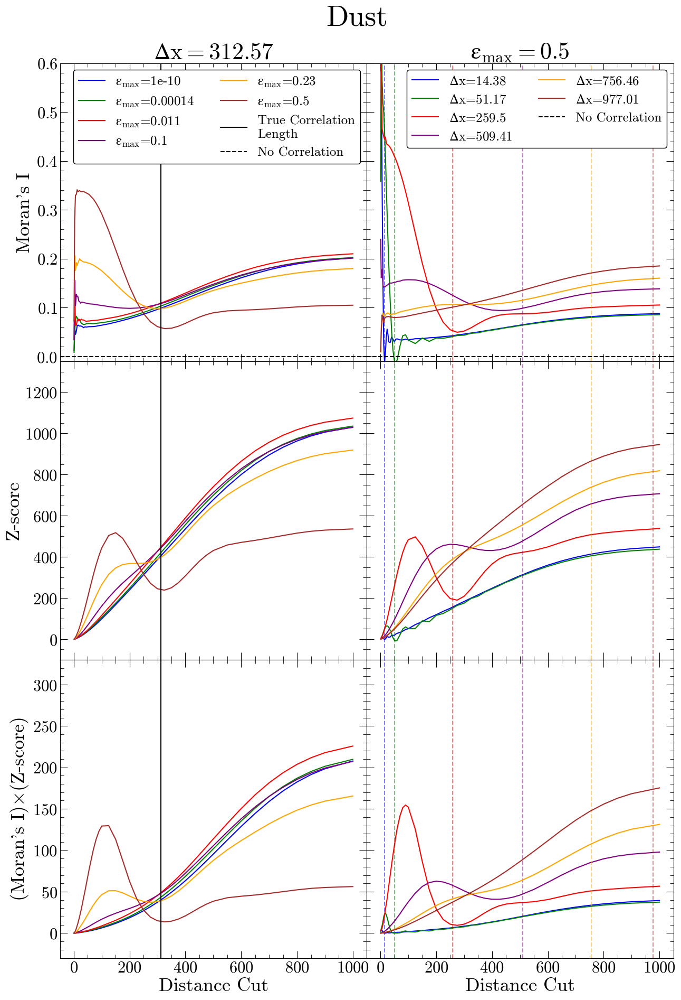

In [7]:
fig, ((ax1,ax4),(ax2,ax5),(ax3,ax6)) = plt.subplots(3,2,figsize=(15,22),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,0.00014,0.011,0.1,0.23,0.5]#[1e-10,2.1e-07,0.00014,0.034,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon_{max}$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    
#One epsilon length, various correlation lengths
epsilon=0.5#0.034
corr_lengths_subset=[14.38, 51.17, 259.5, 509.41, 756.46, 977.01]
for i in range(len(corr_lengths_subset)):
    corr_length=corr_lengths_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax4.plot(final_distances,moransIs,color=color,label='$\Delta x$='+str(corr_length))
    ax4.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax5.plot(final_distances,zscores,color=color)
    ax5.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax6.plot(final_distances,mult,color=color)  
    ax6.axvline(corr_length,color=color,linestyle='--',alpha=0.5)

ax4.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax4.legend(ncol=2,loc='upper right')

ax6.set_xlabel('Distance Cut')

ax4.set_title('$\epsilon_{max}=$'+str(epsilon))

#clean up the plot
ax1.set_ylim(-0.01,0.6)
ax4.set_ylim(-0.01,0.6)

ax2.set_ylim(-100,1350)
ax5.set_ylim(-100,1350)

ax3.set_ylim(-30,330)
ax6.set_ylim(-30,330)

ax4.set_yticklabels([]) 
ax5.set_yticklabels([]) 
ax6.set_yticklabels([]) 

fig.suptitle('Dust', fontsize=40, x=0.5, y=0.93)
plt.subplots_adjust(wspace = 0,hspace=0)

plt.savefig('curves_dust.pdf', dpi=300)#, pad_inches=0.3)

(0.0, 80.0)

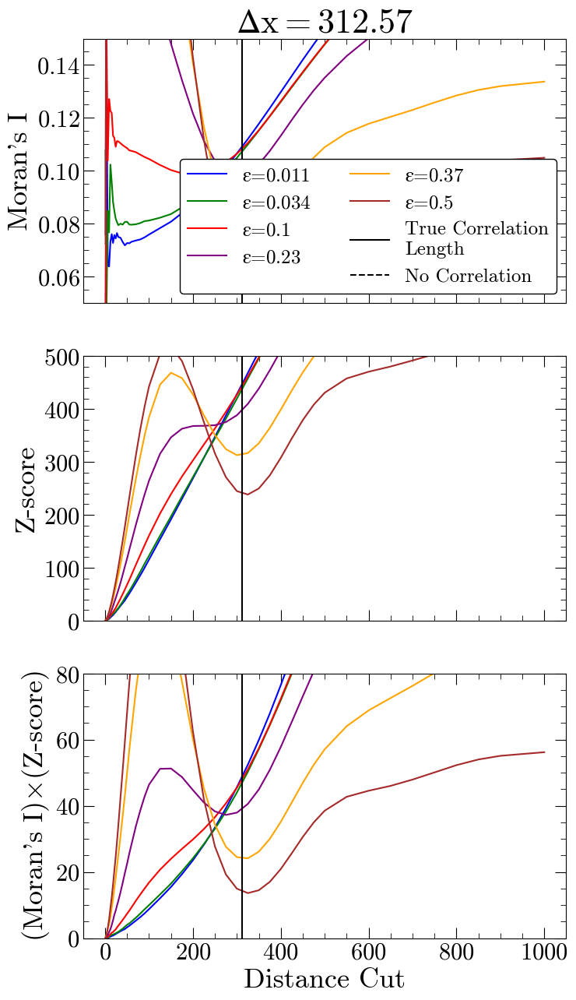

In [15]:
#find minimum visible epsilon

#min=0.1
fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(8,15),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[0.011,0.034,0.1,0.23,0.37,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='lower right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    

#clean up the plot
ax1.set_ylim(0.05,0.15)
ax2.set_ylim(0,500)
ax3.set_ylim(0,80)


# Set up the training and testing data for the CNN

In [16]:
sample_size=10207

x_train=[]
y_train=[]
ep_train=[]
for simulation in simulation_params_run:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_train.append(normalized)
    #save correlation length as true label
    y_train.append(corr_length)
    #also save epsilon
    ep_train.append(epsilon)
    
x_train=np.array(x_train)
y_train=np.array(y_train)
ep_train=np.array(ep_train)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_train=np.nan_to_num(x_train)

#check for NaNs and Infs
print(np.isnan(x_train).any())
print(np.isinf(x_train).any())

training_data=pd.DataFrame()
training_data['y_true']=y_train
training_data['epsilon']=ep_train

training_data.head()

False
False


,y_true,epsilon
0,4.34,1.000000e-10
1,4.34,3.000000e-10
2,4.34,8.900000e-10
3,4.34,2.600000e-09
4,4.34,7.800000e-09


In [17]:
x_test=[]
y_test=[]
ep_test=[]
for simulation in simulation_params_run_testing:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'testing',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_test.append(normalized)
    #save correlation length as true label
    y_test.append(corr_length)
    #also save epsilon
    ep_test.append(epsilon)
    
x_test=np.array(x_test)
y_test=np.array(y_test)
ep_test=np.array(ep_test)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_test=np.nan_to_num(x_test)

#check for NaNs and Infs
print(np.isnan(x_test).any())
print(np.isinf(x_test).any())

testing_data=pd.DataFrame()
testing_data['y_true']=y_test
testing_data['epsilon']=ep_test

testing_data.head()

False
False


,y_true,epsilon
0,10,1.000000e-10
1,10,1.000000e-07
2,10,1.000000e-04
3,10,1.000000e-03
4,10,5.000000e-03


### Train and Test different CNN configurations

In [38]:
def comparison_stats(data,verbose,success_fit=False,success_fit_threshold=0.1):
    if success_fit:
        init_len=len(data)
        data['abs_frac_err']=np.abs((data['y_true']-data['y_pred'])/data['y_true'])
        data=data.query('abs_frac_err<@success_fit_threshold')
        num_success=len(data)
        #reset the indices
        indices=np.arange(0,len(data))
        data.set_index(indices,inplace=True)
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=num_success/init_len
    else:
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=None
    
    error=y_true-y_pred
    frac_err=error/y_true
    
    #calculate the rmse
    rmse = 0
    for i in range(len(y_true)):
        rmse += (error[i])**2
    rmse = np.sqrt(rmse / len(y_true))
    
    #calculate the median absolute error between the datasets
    mae=np.median(np.abs(error))

    #calculate the bias between the datasets
    bias=np.median(error)
    
    #calculate the median absolute fractional error
    med_frac=np.median(np.abs(frac_err))
    
    if verbose:
        if success_fit:
            print(r'Frac Success Fit: {:2.3f} '.format(frac_success))
        print(r'RMSE: {:2.3f} '.format(rmse)+'pc')
        print(r'MAE: {:2.3f} '.format(mae)+'pc')
        print(r'BIAS: {:2.3f} '.format(bias)+'pc')
        print(r'MED FRAC ERR: {:2.3f} '.format(med_frac))
        
    return(rmse,mae,bias,med_frac,error,frac_err,frac_success)

In [39]:
def comparison_plots(training_data,testing_data,success_fit_threshold=0.1,statx=10,staty=700,statdy=50,lim='default', siegel=True,verbose=True):
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    if verbose:
        print('Training Stats')
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,verbose)
    if verbose:
        print('')
        print('Training Stats, Successful Fits')
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,verbose,True,success_fit_threshold)
    if verbose:
        print('')
        print('Testing Stats')
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,verbose)
    if verbose:
        print('')
        print('Testing Stats, Successful Fits')
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,verbose,True,success_fit_threshold)
    
    stats_df=pd.DataFrame()
    stats_df['mae_training']=[mae_training]
    stats_df['frac_success_training']=[frac_success_training]
    stats_df['mae_testing']=[mae_testing]
    stats_df['frac_success_testing']=[frac_success_testing]
    
    #plot the agreement with stats
    fig, (ax1,ax2) =plt.subplots(1,2,figsize=(16,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
        
    ax2.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax2.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax2.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax2.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax2.legend()
    if lim!='default':
        ax2.set_xlim((lim[0],lim[1]))
        ax2.set_ylim((lim[0],lim[1]))
    ax2.set_yscale('log')
    ax2.set_xscale('log')
    plt.show()
    
    #plot the agreement with trendlines
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    #add a linear trendlines
    if siegel==True:
        coef = stats.siegelslopes(y_pred_testing, y_true_testing)
        poly1d_fn = np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    else:
        coef= np.polyfit(y_true_testing,y_pred_testing,1)
        poly1d_fn= np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    plt.show()

    # plot the fractional error between the datasets
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.legend()
    plt.show()
    
    # plot the fractional error between the datasets
    # again but zoomed in
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.set_ylim((-1,1))
    ax1.legend()
    plt.show()
    
    return(stats_df)
    

In [40]:
#define a function to create the heatmap
def heatmap(data, row_labels, col_labels, ax=None):
    if not ax:
        ax = plt.gca()
        
    # Define color map with custom gradients
    cmap = plt.cm.viridis  # Default, replace with any colormap of your choice
    # Define boundaries for the color ranges
    boundaries = [0, 2, 4, 6, 8, 10, 1000]
    # Define colors corresponding to each range (make sure this matches the number of ranges)
    colors_for_ranges = [
    '#228B22',  # Forest Green
    '#32CD32',  # Lime Green
    '#FFD700',  # Gold (Yellow)
    '#FFA500',  # Orange
    '#FF4500',  # Orange Red
    '#DC143C',  # Crimson
    'black']
    # Create a ListedColormap and BoundaryNorm
    cmap = pltcolors.ListedColormap(colors_for_ranges)
    norm = pltcolors.BoundaryNorm(boundaries, cmap.N)
    
    # Plot the heatmap
    im = ax.imshow(data, cmap=cmap, norm=norm)
    
    #label rows/columns
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels)#, fontsize=10)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels)
    
    #draw grid lines
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="k", linestyle='-', linewidth=0.5,alpha=0.3)
    ax.tick_params(which="minor", bottom=False, left=False,top=False, right=False)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    return im

def heatmap_testing_data(testing_data,figtitle=None,savefig=False,figname=None):
    data=[]
    failed_fit_region_count=0
    for corr_len in corr_lengths_testing:
        tmp=[]
        for epsilon in epsilons_testing:
            val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
            tmp.append(val)
            if val>10:
                failed_fit_region_count+=1
        data.append(tmp)
    data=np.array(data)
    
    fig,ax0=plt.subplots(1, 1, figsize=(10, 10))
    ylabels=[str(i) for i in corr_lengths_testing]
    xlabels=[str(i) for i in epsilons_testing]
    hm=heatmap(data, ylabels, xlabels, ax=ax0)
    ax0.set_xlabel('$\epsilon$')
    ax0.set_ylabel('$\Delta x_{true}$')
    
    ax0.set_title(figtitle)
    
    #plot colorbar
    cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
    fig.colorbar(hm, cbar_ax)
    cbar_ax.set_ylabel("Absolute Percent Error")#,fontsize=16)
    
    if savefig:
        plt.savefig(figname+'.pdf', dpi=300)
        
    plt.show()
    print('Number of squares with abs percent err>10%, ', failed_fit_region_count)
    
    return(failed_fit_region_count)

In [55]:
def test_model(model,stats=True,plot=True):
    sample_size=10207
    
    # use the model to predict the training data
    y_pred_train = model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the testing data
    y_pred_test = model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold=0.1)
    
    if plot:
        #some runs return NaNs, show those fits
        nan_corr_lengths=testing_data[testing_data['y_pred'].isna()]
        print('')
        print('Showing the '+str(len(nan_corr_lengths))+' curves that returned NaNs')
        display(nan_corr_lengths)
        for i in range(len(nan_corr_lengths)):
            corr_length=nan_corr_lengths['y_true'].to_list()[i]
            epsilon=nan_corr_lengths['epsilon'].to_list()[i]
            output=get_output(corr_length,epsilon,sample_size,'testing',plot=True)

        #show comparison stats and plots
        stats_df=comparison_plots(training_data,testing_data)
        
        #show testing data absolute percent error heatmap
        failed_fit_region_count=heatmap_testing_data(testing_data) 
    else:
        stats_df=None
        nan_corr_lengths='Not saved!'
        failed_fit_region_count=0
        for corr_len in corr_lengths_testing:
            for epsilon in epsilons_testing:
                val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
                if val>10:
                    failed_fit_region_count+=1
    
    if stats:
        return(stats_df)
    else:
        return(failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths)

# Pick models and tune the model hyperparameters

1. **Number of Filters in Convolutional Layers**
   The number of filters (also known as the number of output channels) determines the depth of the feature maps after each convolutional layer.
   **What to try:**
   - You can experiment with **increasing** the number of filters in each layer.
   - Alternatively, **decrease** the number of filters to make the model simpler and see if performance improves.
   
   Keep in mind that increasing the number of filters typically increases the model’s capacity, which can improve performance on more complex tasks but may also lead to overfitting if not properly regularized.

2. **Kernel Size**
   The kernel size defines the window of the convolution. 
   **What to try:**
   - **Larger kernel sizes** (e.g., 5 or 7) might capture broader patterns, which can be useful if the input data has long-range dependencies.
   - **Smaller kernel sizes** (e.g., 1 or 2) might be beneficial if you want to capture very fine-grained features.

3. **Number of Layers**
   The depth of the network can have a significant impact on its performance.
   **What to try:**
   - Adding more **convolutional layers** (e.g., 4 or 5 layers instead of 3) could help the model learn more complex patterns.
   - Alternatively, you can **reduce the number of layers** and see if performance improves, especially if overfitting is a concern.

4. **Pooling Layers**
   Pooling layers help reduce spatial dimensions and retain important features. You're using `MaxPooling1D(2)` after each convolution layer, which is a good starting point.
   **What to try:**
   - **Change the pooling size** (e.g., use `MaxPooling1D(3)` or `MaxPooling1D(4)`).
   - Experiment with different **types of pooling** (e.g., **AveragePooling1D**) to see if it affects performance.

5. **Dense Layer Units**
   In your current model, the final dense layer has 128 units with ReLU activation. The number of units in this layer controls the representational capacity of the fully connected portion of the network.
   **What to try:**
   - You can experiment with **increasing** or **decreasing** the number of units (e.g., try 64 or 256 units).
   - You can also **add another dense layer** between the existing dense layer and the output to increase the model's capacity.

6. **Optimizer and Learning Rate**
   You're using the **Adam optimizer** with its default settings, which is a good default choice for most tasks. However, adjusting the learning rate can have a significant impact on performance.
   **What to try:**
   - **Adjust the learning rate** (e.g., `learning_rate=0.001`, `learning_rate=0.0005`, `learning_rate=0.0001`).
   - You could also experiment with **different optimizers** (e.g., **SGD**, **RMSprop**) to see if they improve convergence speed or final accuracy.

7. **Batch Size**
   The batch size you’re currently using is 32, which is a standard choice.
   **What to try:**
   - Experiment with **larger batch sizes** (e.g., 64 or 128) to speed up training, or **smaller batch sizes** (e.g., 16 or 8) if you believe that could help the model generalize better.
   - Smaller batch sizes can help avoid local minima, while larger batch sizes usually converge faster.

8. **Regularization (Dropout or L2 Regularization)**
   You’re not using any regularization at the moment, which may cause overfitting, especially with a deep model.
   **What to try:**
   - **Dropout**: Add `Dropout` layers after the convolutional or dense layers to help prevent overfitting. Try dropout rates between 0.2 and 0.5.
   - **L2 Regularization**: Add L2 regularization to your layers, which helps penalize large weights and reduces overfitting. Example: `kernel_regularizer=l2(0.01)`.

9. **Activation Function**
   You're using ReLU as the activation function for all layers, which is quite common.
   **What to try:**
   - Experiment with different **activation functions** for the hidden layers, such as **LeakyReLU**, **ELU**, or **SELU**.
   - For the output layer, if you're predicting a continuous variable (since you're using `mse` loss), you may want to use a **linear activation** (which is the default for `Dense(1)`).


Epoch 1/100
92/92 [==============================] - 0s 2ms/step - loss: 125181.5469
Epoch 2/100
92/92 [==============================] - 0s 2ms/step - loss: 68532.4375
Epoch 3/100
92/92 [==============================] - 0s 2ms/step - loss: 67860.3906
Epoch 4/100
92/92 [==============================] - 0s 3ms/step - loss: 67232.8125
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 66906.1406
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 66518.3516
Epoch 7/100
92/92 [==============================] - 0s 2ms/step - loss: 66298.2266
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 66372.1406
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 66047.5859
Epoch 10/100
92/92 [==============================] - 0s 2ms/step - loss: 65896.8984
Epoch 11/100
92/92 [==============================] - 0s 2ms/step - loss: 65953.4531
Epoch 12/100
92/92 [==============================] - 0s 2ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 248.846 pc
MAE: 174.554 pc
BIAS: -36.158 pc
MED FRAC ERR: 0.572 

Training Stats, Successful Fits
Frac Success Fit: 0.110 
RMSE: 18.200 pc
MAE: 13.619 pc
BIAS: -1.000 pc
MED FRAC ERR: 0.049 

Testing Stats
RMSE: 295.111 pc
MAE: 183.584 pc
BIAS: 11.083 pc
MED FRAC ERR: 0.496 

Testing Stats, Successful Fits
Frac Success Fit: 0.168 
RMSE: 17.054 pc
MAE: 8.813 pc
BIAS: -0.981 pc
MED FRAC ERR: 0.032 


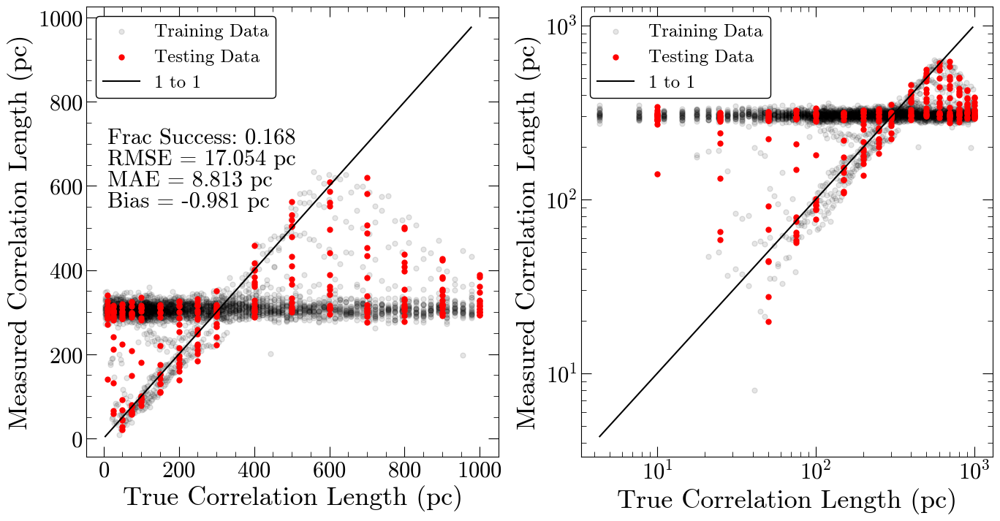

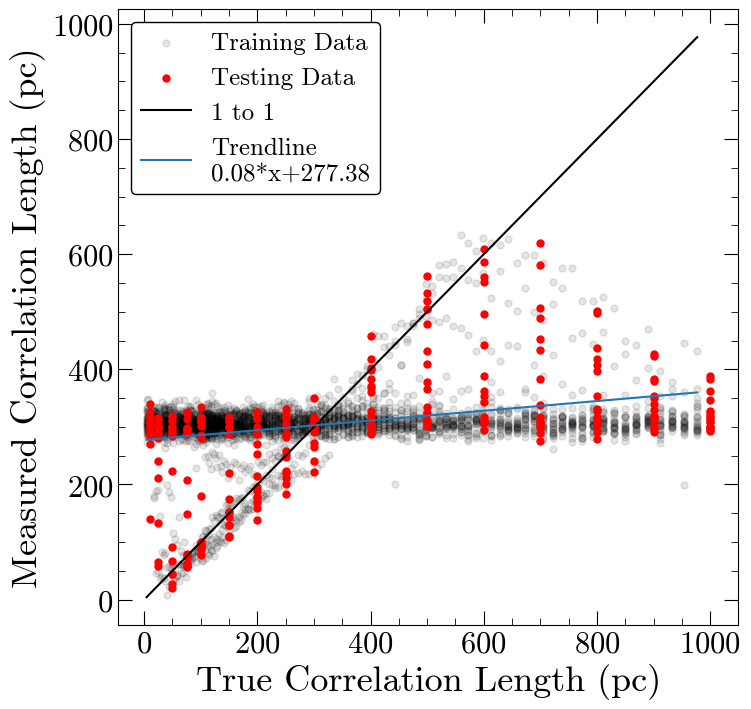

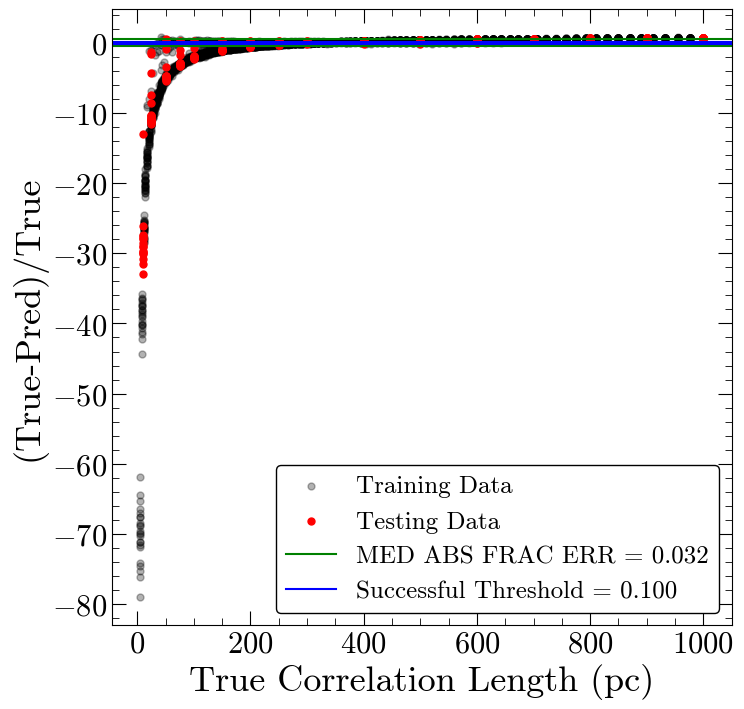

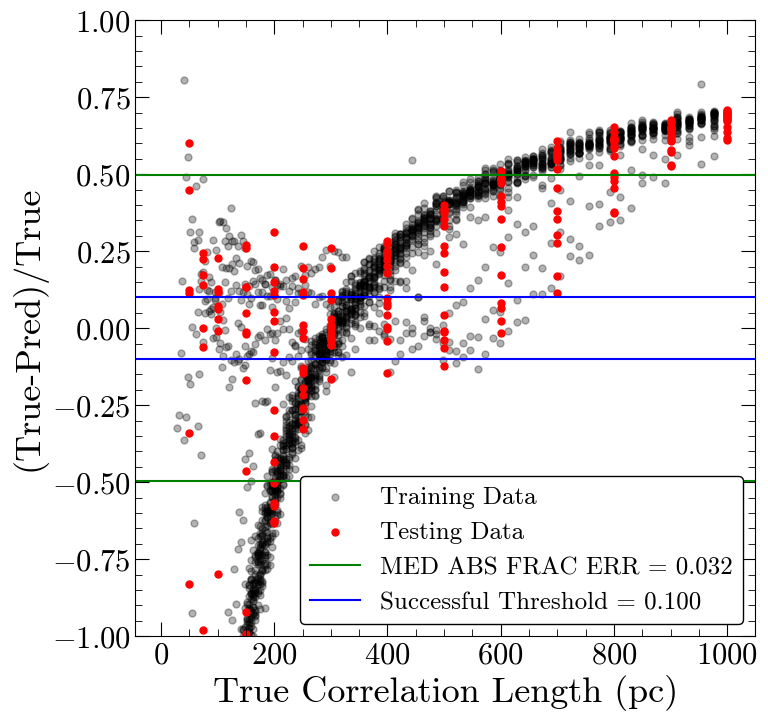

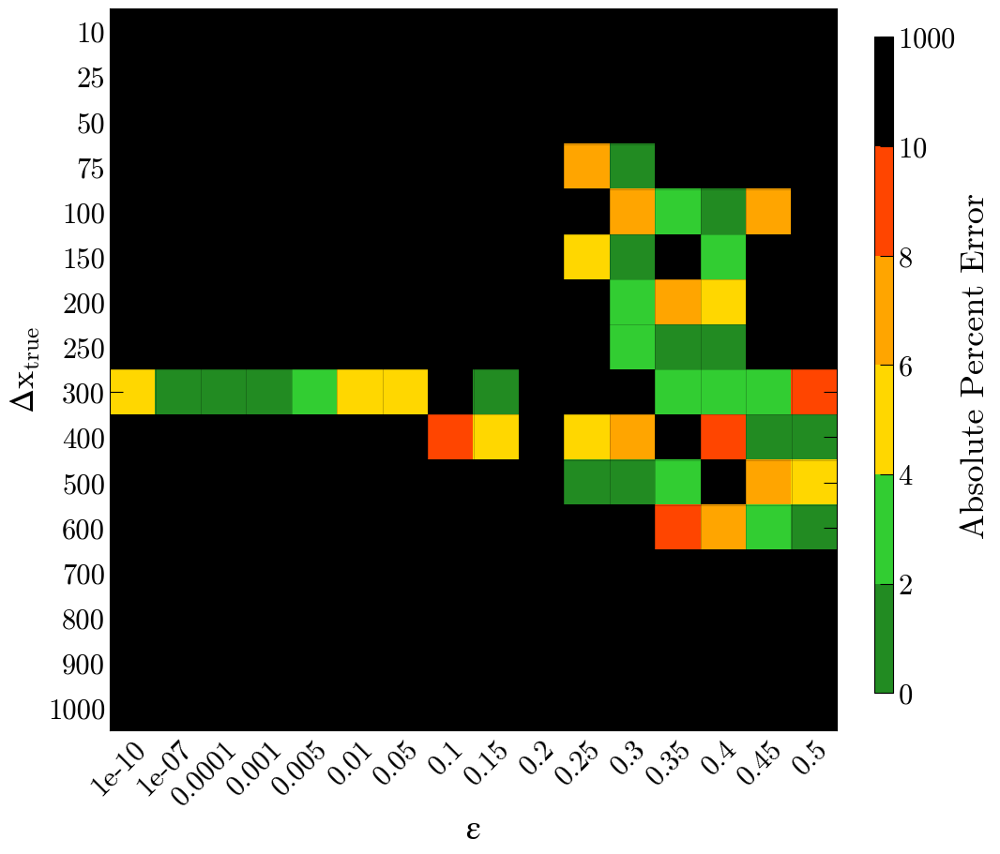

Number of squares with abs percent err>10%,  213


In [42]:
#simple model
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats for all models to compare and find best model
all_model_stats=output

Epoch 1/200
92/92 [==============================] - 1s 3ms/step - loss: 120739.8750
Epoch 2/200
92/92 [==============================] - 0s 3ms/step - loss: 69249.5859
Epoch 3/200
92/92 [==============================] - 0s 4ms/step - loss: 67584.0312
Epoch 4/200
92/92 [==============================] - 0s 4ms/step - loss: 67043.6016
Epoch 5/200
92/92 [==============================] - 0s 3ms/step - loss: 66831.8828
Epoch 6/200
92/92 [==============================] - 0s 4ms/step - loss: 66200.0391
Epoch 7/200
92/92 [==============================] - 0s 4ms/step - loss: 66292.0547
Epoch 8/200
92/92 [==============================] - 0s 4ms/step - loss: 65904.6406
Epoch 9/200
92/92 [==============================] - 0s 4ms/step - loss: 65910.5938
Epoch 10/200
92/92 [==============================] - 0s 4ms/step - loss: 65615.7344
Epoch 11/200
92/92 [==============================] - 0s 4ms/step - loss: 65699.9766
Epoch 12/200
92/92 [==============================] - 0s 4ms/step - loss:

92/92 [==============================] - 0s 5ms/step - loss: 60661.4922
Epoch 193/200
92/92 [==============================] - 0s 5ms/step - loss: 61168.8945
Epoch 194/200
92/92 [==============================] - 1s 7ms/step - loss: 61005.1289
Epoch 195/200
92/92 [==============================] - 1s 8ms/step - loss: 61057.5938
Epoch 196/200
92/92 [==============================] - 1s 7ms/step - loss: 61420.9258
Epoch 197/200
92/92 [==============================] - 1s 8ms/step - loss: 60647.5820
Epoch 198/200
92/92 [==============================] - 1s 6ms/step - loss: 61019.6797
Epoch 199/200
92/92 [==============================] - 1s 7ms/step - loss: 60786.2461
Epoch 200/200
92/92 [==============================] - 0s 4ms/step - loss: 60802.6445

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 246.135 pc
MAE: 184.975 pc
BIAS: -57.589 pc
MED FRAC ERR: 0.560 

Training Stats, Successful Fits
Frac Success Fit: 0.152 
RMSE: 18.426 pc
MAE: 10.263 pc
BIAS: 0.278 pc
MED FRAC ERR: 0.045 

Testing Stats
RMSE: 273.625 pc
MAE: 146.440 pc
BIAS: -1.283 pc
MED FRAC ERR: 0.407 

Testing Stats, Successful Fits
Frac Success Fit: 0.250 
RMSE: 17.380 pc
MAE: 8.319 pc
BIAS: -0.956 pc
MED FRAC ERR: 0.038 


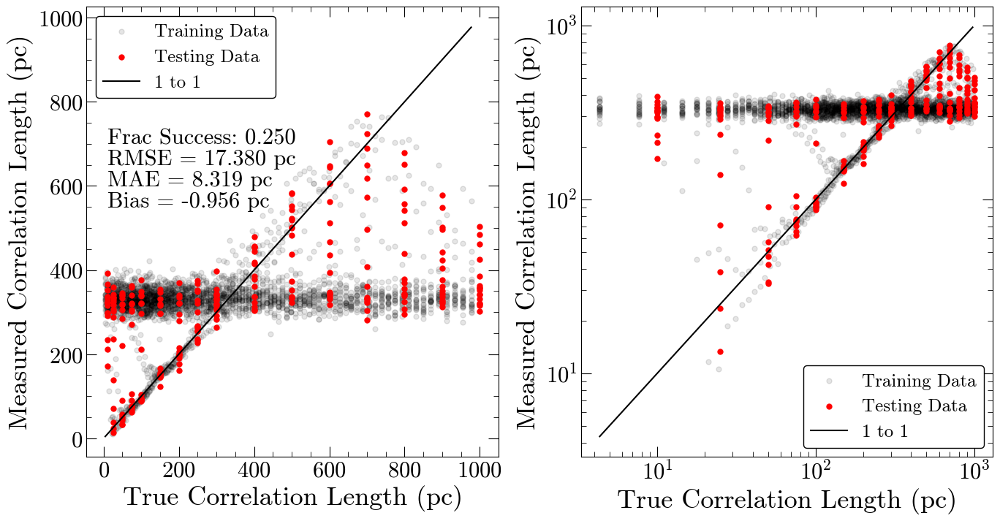

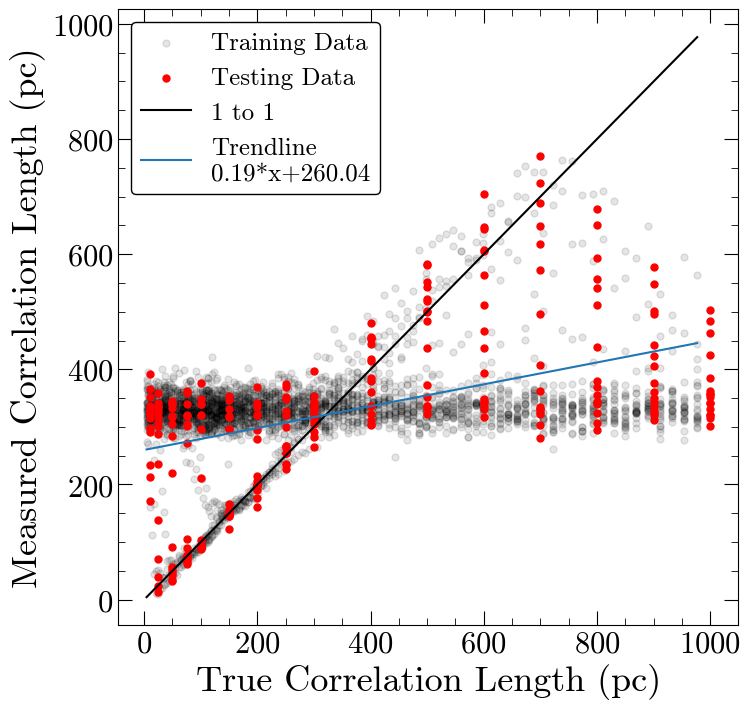

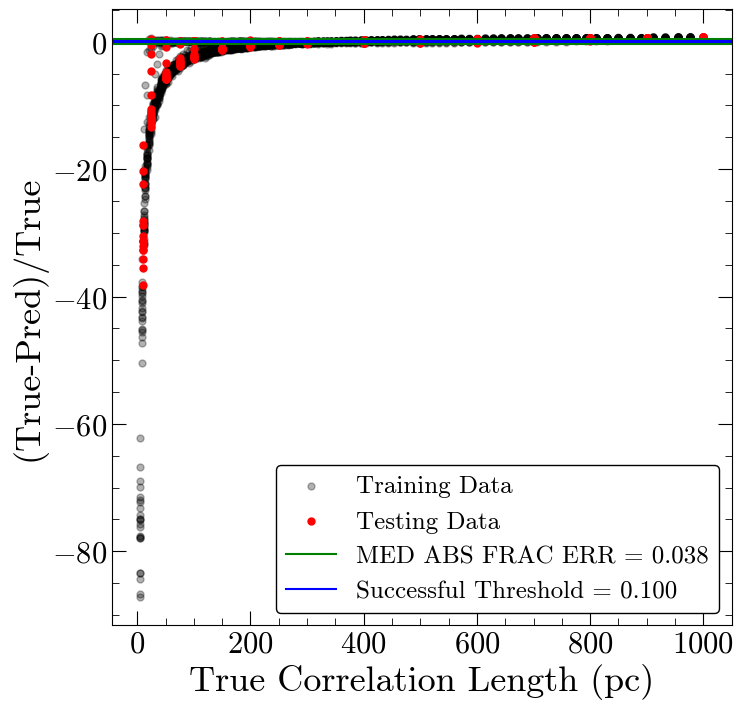

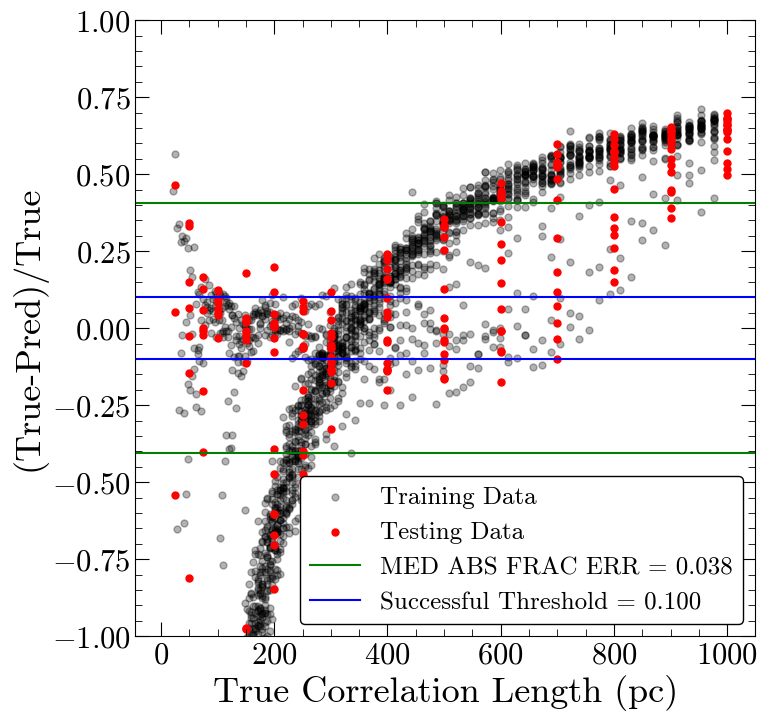

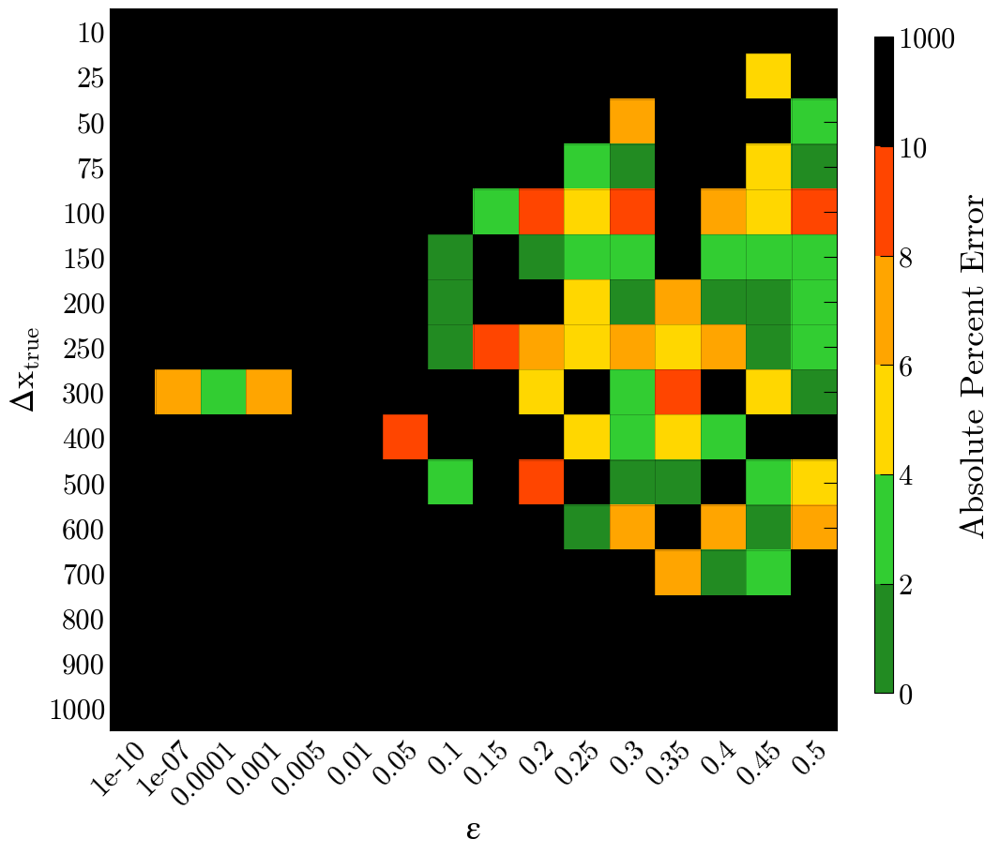

Number of squares with abs percent err>10%,  192


In [43]:
#simple model, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 7ms/step - loss: 102583.2109
Epoch 2/100
92/92 [==============================] - 1s 7ms/step - loss: 67602.0391
Epoch 3/100
92/92 [==============================] - 1s 8ms/step - loss: 66462.4531
Epoch 4/100
92/92 [==============================] - 1s 7ms/step - loss: 66327.0312
Epoch 5/100
92/92 [==============================] - 1s 7ms/step - loss: 66347.1719
Epoch 6/100
92/92 [==============================] - 1s 8ms/step - loss: 65973.4141
Epoch 7/100
92/92 [==============================] - 1s 8ms/step - loss: 66042.1797
Epoch 8/100
92/92 [==============================] - 1s 7ms/step - loss: 65849.2891
Epoch 9/100
92/92 [==============================] - 1s 8ms/step - loss: 65643.5391
Epoch 10/100
92/92 [==============================] - 1s 8ms/step - loss: 65444.5469
Epoch 11/100
92/92 [==============================] - 1s 11ms/step - loss: 65590.2578
Epoch 12/100
92/92 [==============================] - 1s 11ms/step - los

92/92 [==============================] - 1s 8ms/step - loss: 60809.0234
Epoch 98/100
92/92 [==============================] - 1s 14ms/step - loss: 61216.7617
Epoch 99/100
92/92 [==============================] - 1s 11ms/step - loss: 61086.6914
Epoch 100/100
92/92 [==============================] - 1s 8ms/step - loss: 61617.4180

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 246.459 pc
MAE: 185.887 pc
BIAS: -62.787 pc
MED FRAC ERR: 0.567 

Training Stats, Successful Fits
Frac Success Fit: 0.122 
RMSE: 19.539 pc
MAE: 12.510 pc
BIAS: 1.170 pc
MED FRAC ERR: 0.048 

Testing Stats
RMSE: 273.258 pc
MAE: 148.573 pc
BIAS: -2.240 pc
MED FRAC ERR: 0.425 

Testing Stats, Successful Fits
Frac Success Fit: 0.211 
RMSE: 23.655 pc
MAE: 11.287 pc
BIAS: -2.240 pc
MED FRAC ERR: 0.052 


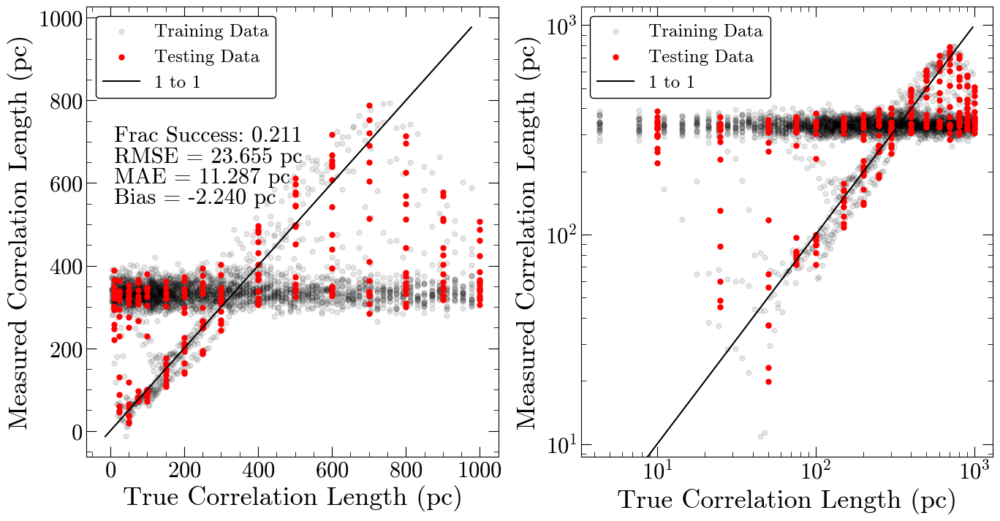

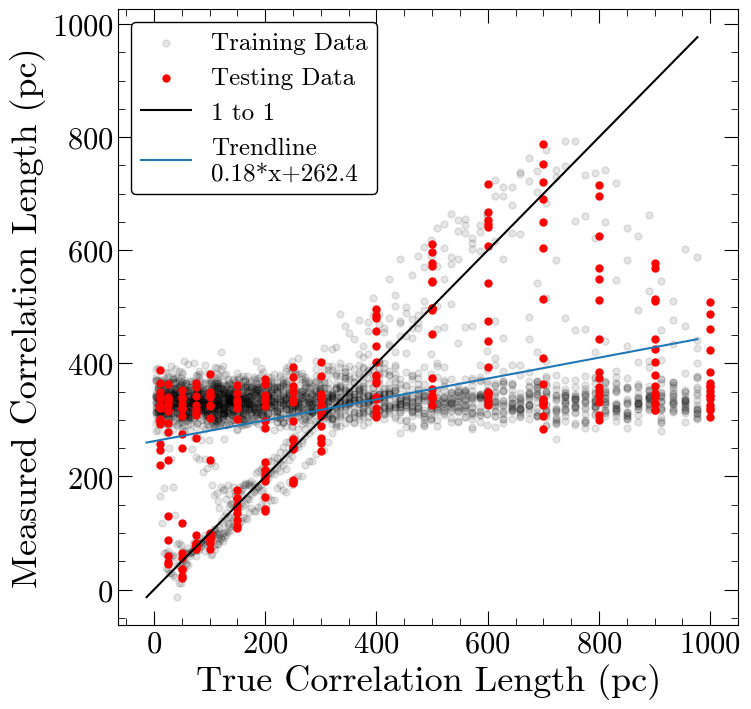

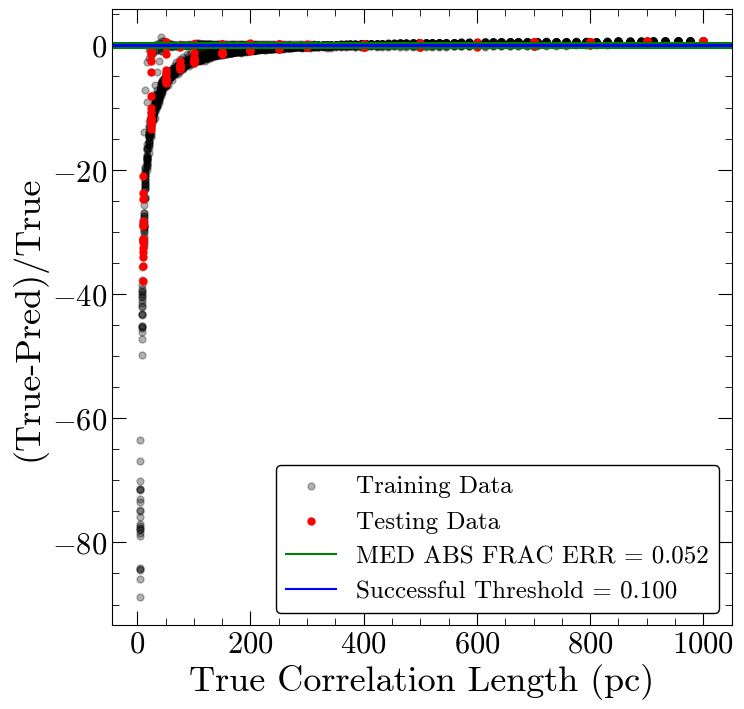

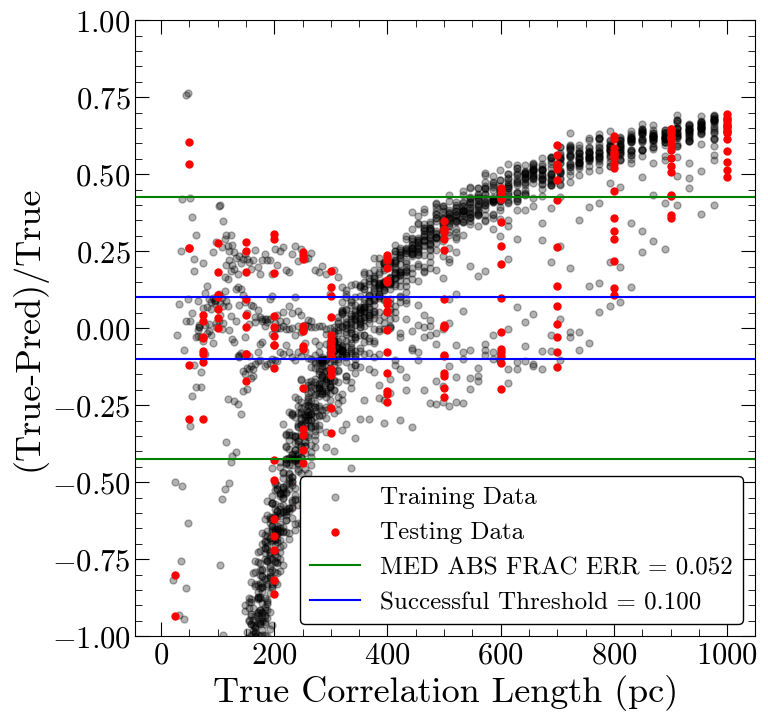

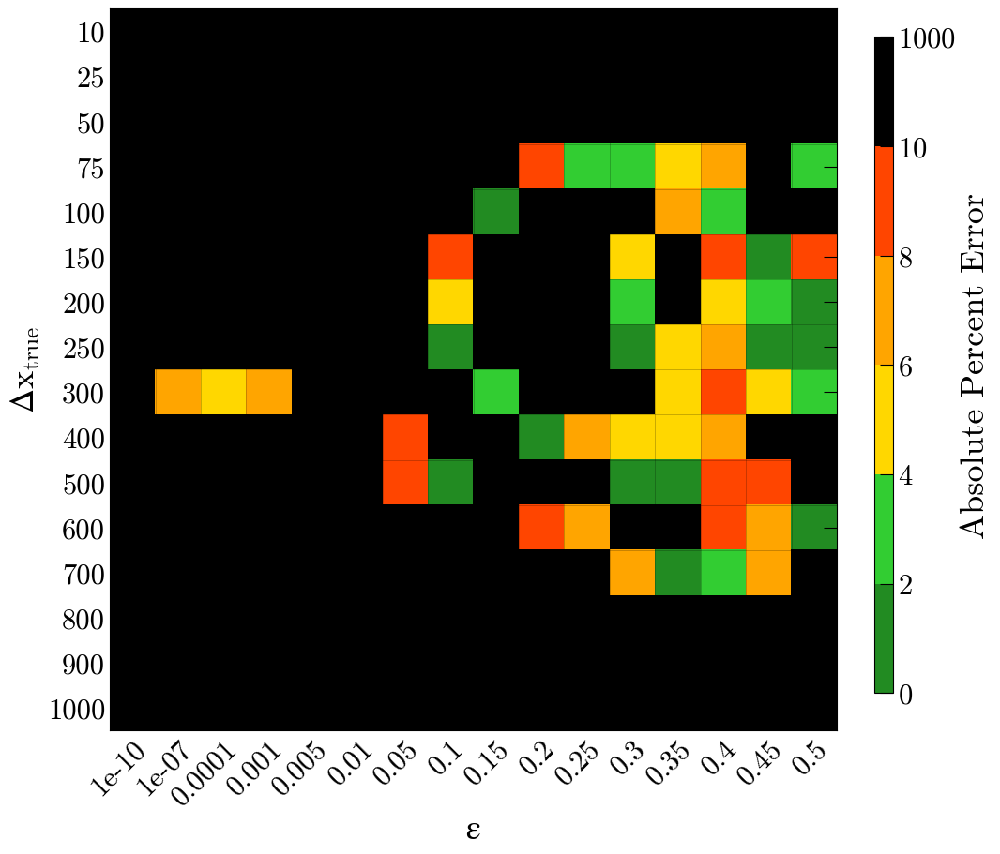

Number of squares with abs percent err>10%,  202


In [44]:
#model with more layers
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 1s 8ms/step - loss: 105271.8359
Epoch 2/200
92/92 [==============================] - 1s 10ms/step - loss: 68282.4766
Epoch 3/200
92/92 [==============================] - 1s 8ms/step - loss: 67250.8438
Epoch 4/200
92/92 [==============================] - 1s 10ms/step - loss: 66427.7969
Epoch 5/200
92/92 [==============================] - 1s 10ms/step - loss: 66111.5859
Epoch 6/200
92/92 [==============================] - 1s 10ms/step - loss: 65982.8672
Epoch 7/200
92/92 [==============================] - 1s 10ms/step - loss: 65598.9922
Epoch 8/200
92/92 [==============================] - 1s 9ms/step - loss: 65457.4531
Epoch 9/200
92/92 [==============================] - 1s 10ms/step - loss: 65217.8086
Epoch 10/200
92/92 [==============================] - 1s 11ms/step - loss: 65148.0820
Epoch 11/200
92/92 [==============================] - 1s 15ms/step - loss: 65021.0742
Epoch 12/200
92/92 [==============================] - 1s 10ms/ste

92/92 [==============================] - 1s 11ms/step - loss: 59305.2852
Epoch 191/200
92/92 [==============================] - 1s 11ms/step - loss: 59034.5078
Epoch 192/200
92/92 [==============================] - 1s 12ms/step - loss: 59149.4023
Epoch 193/200
92/92 [==============================] - 1s 12ms/step - loss: 58909.4492
Epoch 194/200
92/92 [==============================] - 1s 12ms/step - loss: 58767.9844
Epoch 195/200
92/92 [==============================] - 1s 12ms/step - loss: 59375.0859
Epoch 196/200
92/92 [==============================] - 1s 11ms/step - loss: 59556.2656
Epoch 197/200
92/92 [==============================] - 1s 10ms/step - loss: 59390.0156
Epoch 198/200
92/92 [==============================] - 1s 10ms/step - loss: 59290.0391
Epoch 199/200
92/92 [==============================] - 1s 10ms/step - loss: 59122.2188
Epoch 200/200
92/92 [==============================] - 1s 10ms/step - loss: 58854.0078

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 244.586 pc
MAE: 149.040 pc
BIAS: -3.573 pc
MED FRAC ERR: 0.549 

Training Stats, Successful Fits
Frac Success Fit: 0.139 
RMSE: 19.925 pc
MAE: 13.661 pc
BIAS: 7.345 pc
MED FRAC ERR: 0.054 

Testing Stats
RMSE: 267.599 pc
MAE: 83.937 pc
BIAS: 19.374 pc
MED FRAC ERR: 0.334 

Testing Stats, Successful Fits
Frac Success Fit: 0.250 
RMSE: 27.440 pc
MAE: 15.013 pc
BIAS: 9.797 pc
MED FRAC ERR: 0.043 


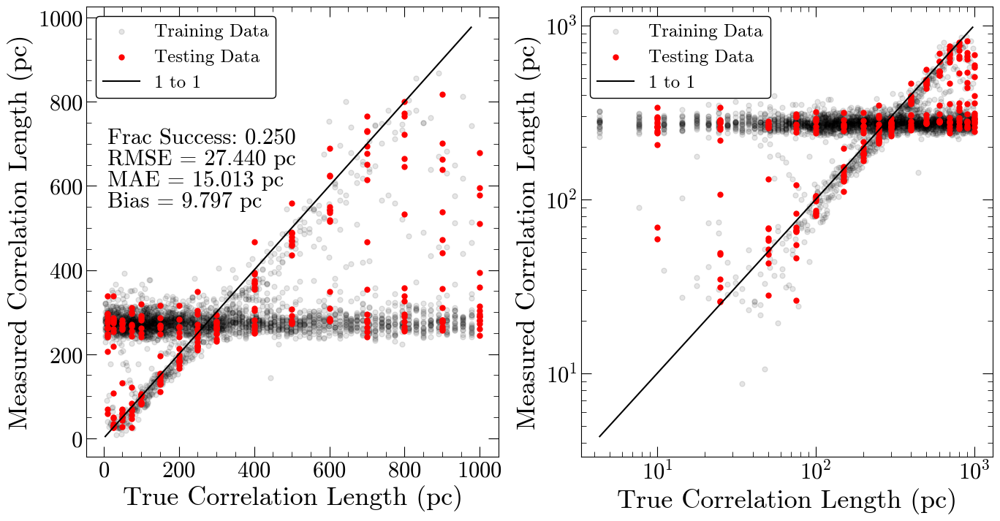

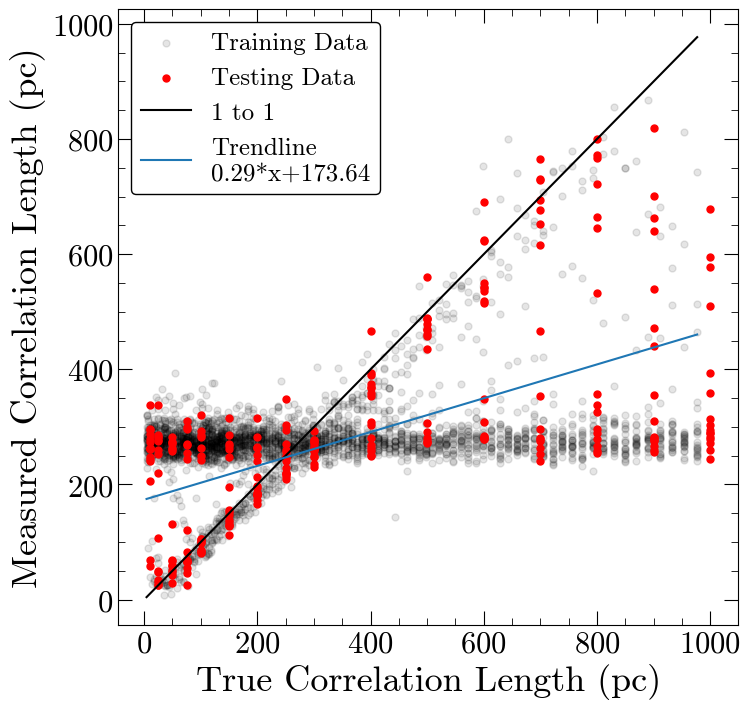

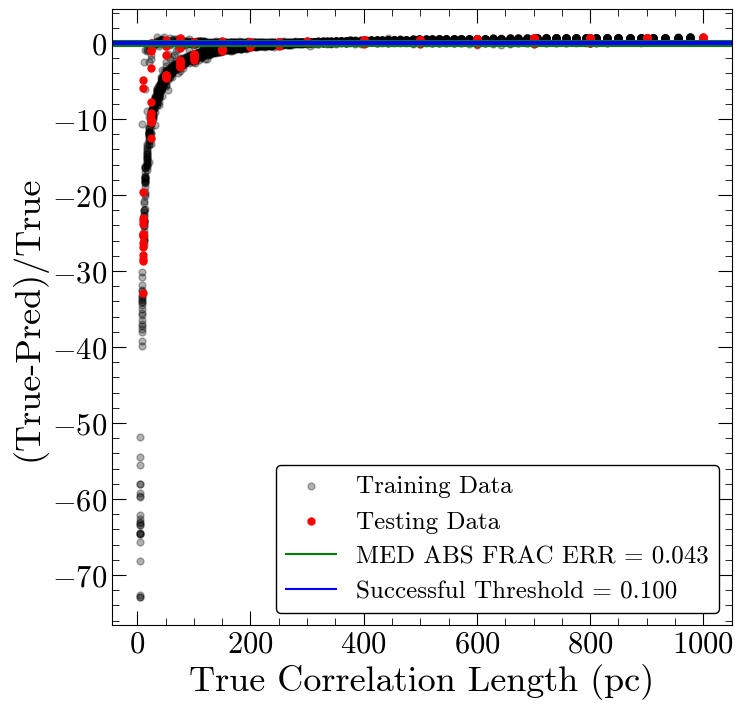

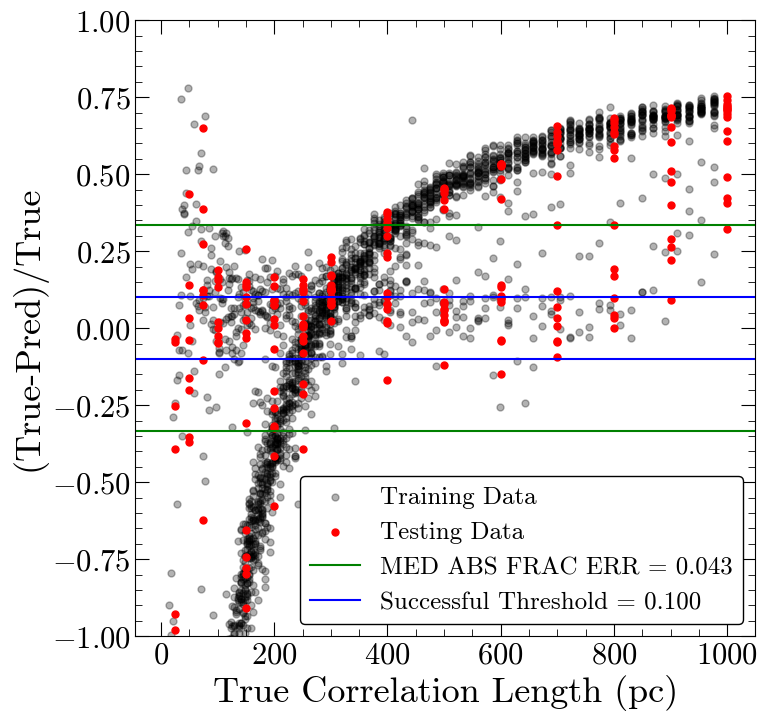

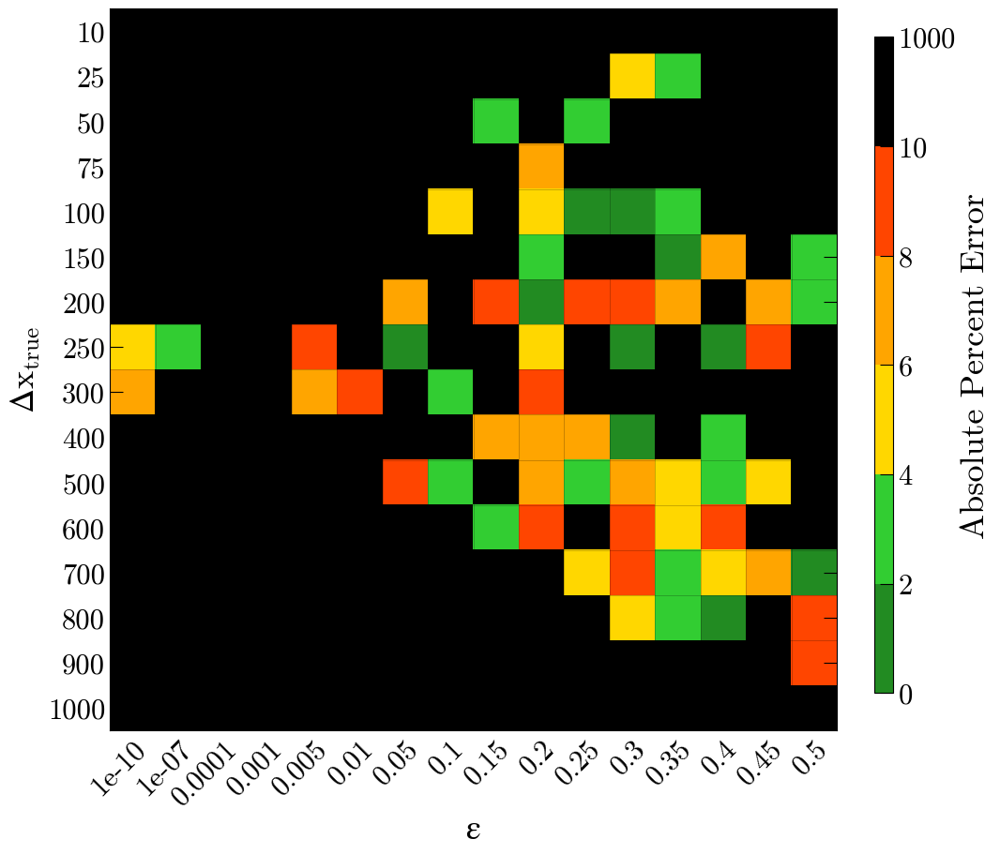

Number of squares with abs percent err>10%,  192


In [45]:
#model with more layers, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 9ms/step - loss: 111012.5391
Epoch 2/100
92/92 [==============================] - 1s 7ms/step - loss: 68680.8125
Epoch 3/100
92/92 [==============================] - 1s 10ms/step - loss: 67691.5000
Epoch 4/100
92/92 [==============================] - 1s 9ms/step - loss: 67484.5391
Epoch 5/100
92/92 [==============================] - 1s 9ms/step - loss: 67012.5938
Epoch 6/100
92/92 [==============================] - 1s 8ms/step - loss: 67354.5625
Epoch 7/100
92/92 [==============================] - 1s 9ms/step - loss: 67079.5000
Epoch 8/100
92/92 [==============================] - 1s 8ms/step - loss: 66900.4609
Epoch 9/100
92/92 [==============================] - 1s 8ms/step - loss: 66871.9844
Epoch 10/100
92/92 [==============================] - 1s 11ms/step - loss: 66755.7031
Epoch 11/100
92/92 [==============================] - 1s 11ms/step - loss: 66341.7344
Epoch 12/100
92/92 [==============================] - 1s 9ms/step - lo

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 246.541 pc
MAE: 187.382 pc
BIAS: -68.507 pc
MED FRAC ERR: 0.569 

Training Stats, Successful Fits
Frac Success Fit: 0.113 
RMSE: 19.426 pc
MAE: 12.906 pc
BIAS: 1.708 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 272.647 pc
MAE: 146.212 pc
BIAS: -21.607 pc
MED FRAC ERR: 0.437 

Testing Stats, Successful Fits
Frac Success Fit: 0.172 
RMSE: 22.409 pc
MAE: 10.160 pc
BIAS: -2.296 pc
MED FRAC ERR: 0.050 


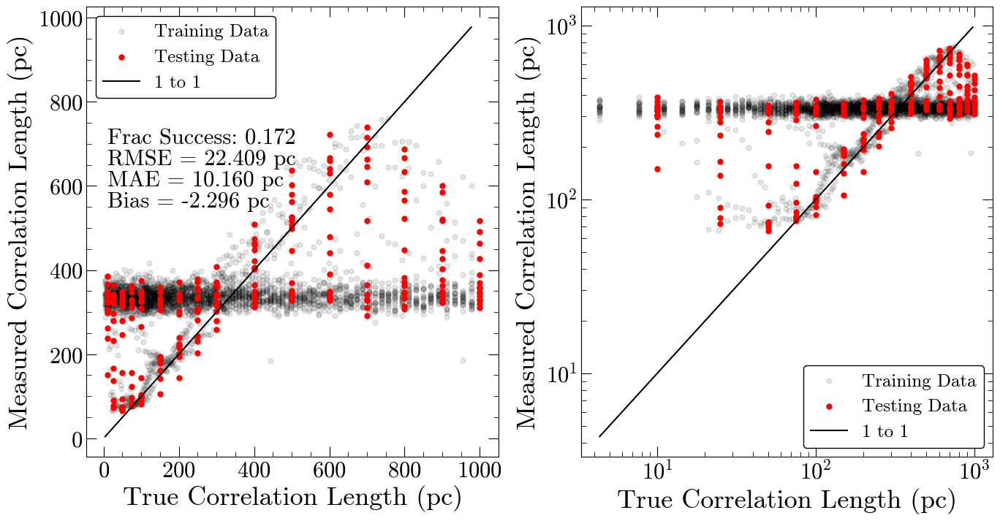

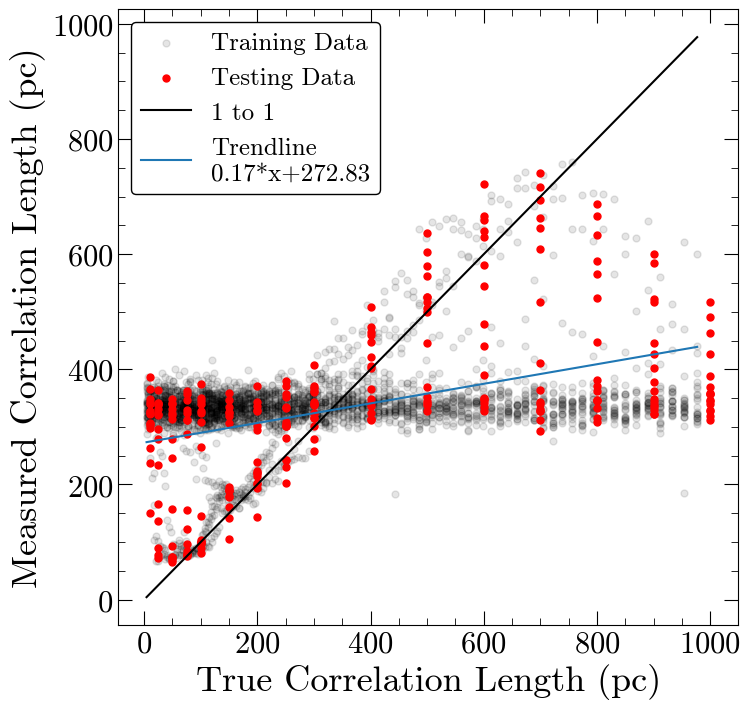

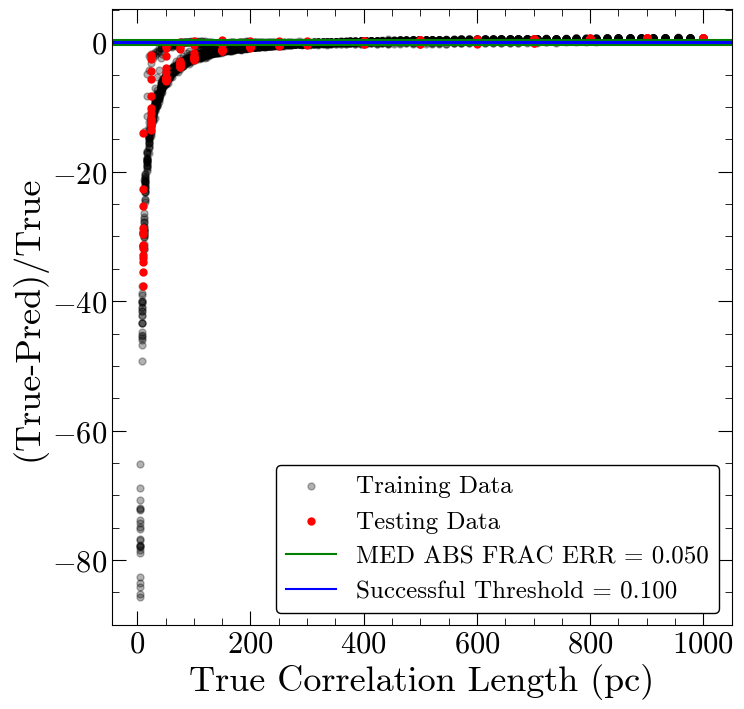

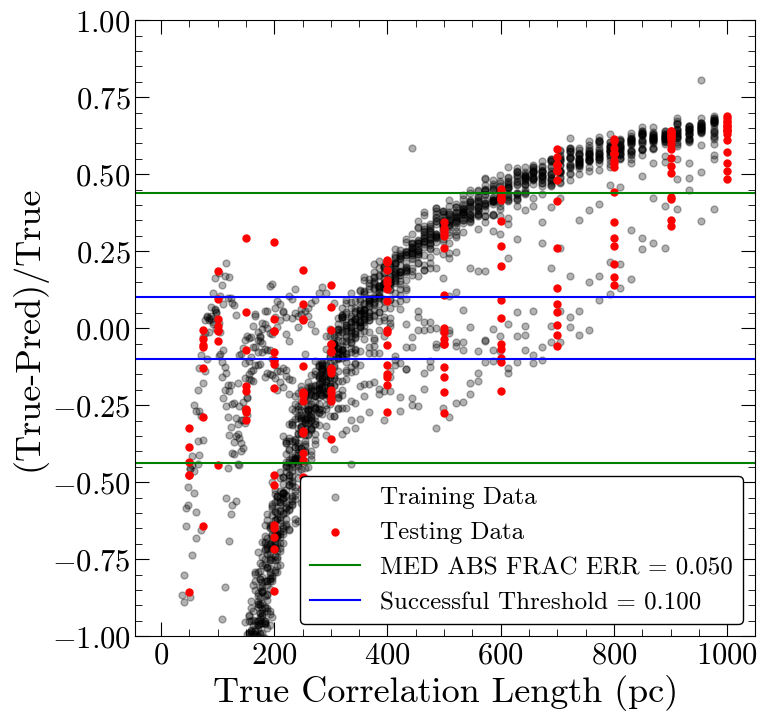

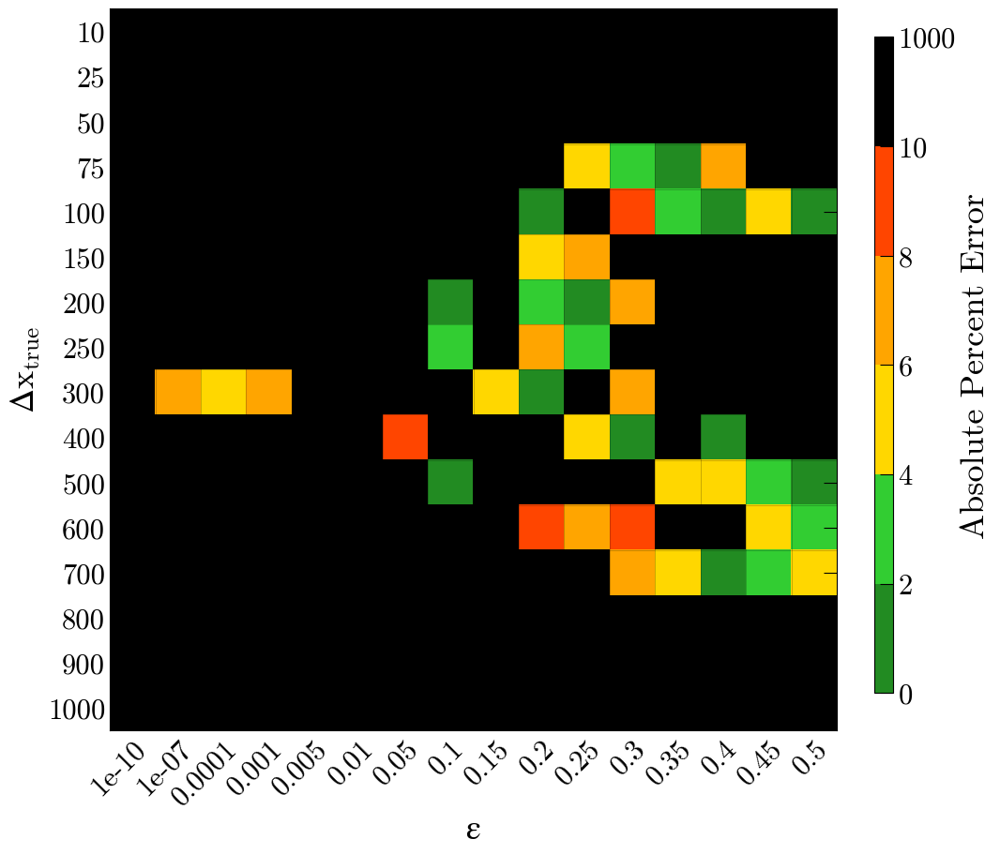

Number of squares with abs percent err>10%,  212


In [46]:
#model with more layers, increase max pooling in first layer
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 13ms/step - loss: 105189.1406
Epoch 2/100
92/92 [==============================] - 1s 10ms/step - loss: 68215.4531
Epoch 3/100
92/92 [==============================] - 1s 8ms/step - loss: 67782.4297
Epoch 4/100
92/92 [==============================] - 1s 9ms/step - loss: 67162.9062
Epoch 5/100
92/92 [==============================] - 1s 10ms/step - loss: 67150.5312
Epoch 6/100
92/92 [==============================] - 1s 10ms/step - loss: 66928.6484
Epoch 7/100
92/92 [==============================] - 1s 9ms/step - loss: 66686.1172
Epoch 8/100
92/92 [==============================] - 1s 8ms/step - loss: 66898.5781
Epoch 9/100
92/92 [==============================] - 1s 10ms/step - loss: 67586.9453
Epoch 10/100
92/92 [==============================] - 1s 10ms/step - loss: 66785.4062
Epoch 11/100
92/92 [==============================] - 1s 11ms/step - loss: 66445.5547
Epoch 12/100
92/92 [==============================] - 1s 9ms/step 

92/92 [==============================] - 1s 8ms/step - loss: 61277.5078
Epoch 98/100
92/92 [==============================] - 1s 10ms/step - loss: 61374.7305
Epoch 99/100
92/92 [==============================] - 1s 7ms/step - loss: 60763.6719
Epoch 100/100
92/92 [==============================] - 1s 7ms/step - loss: 61186.0039

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 246.053 pc
MAE: 175.624 pc
BIAS: -46.031 pc
MED FRAC ERR: 0.571 

Training Stats, Successful Fits
Frac Success Fit: 0.113 
RMSE: 19.233 pc
MAE: 12.538 pc
BIAS: 0.584 pc
MED FRAC ERR: 0.047 

Testing Stats
RMSE: 277.927 pc
MAE: 151.506 pc
BIAS: 11.513 pc
MED FRAC ERR: 0.448 

Testing Stats, Successful Fits
Frac Success Fit: 0.188 
RMSE: 17.753 pc
MAE: 11.044 pc
BIAS: 5.068 pc
MED FRAC ERR: 0.041 


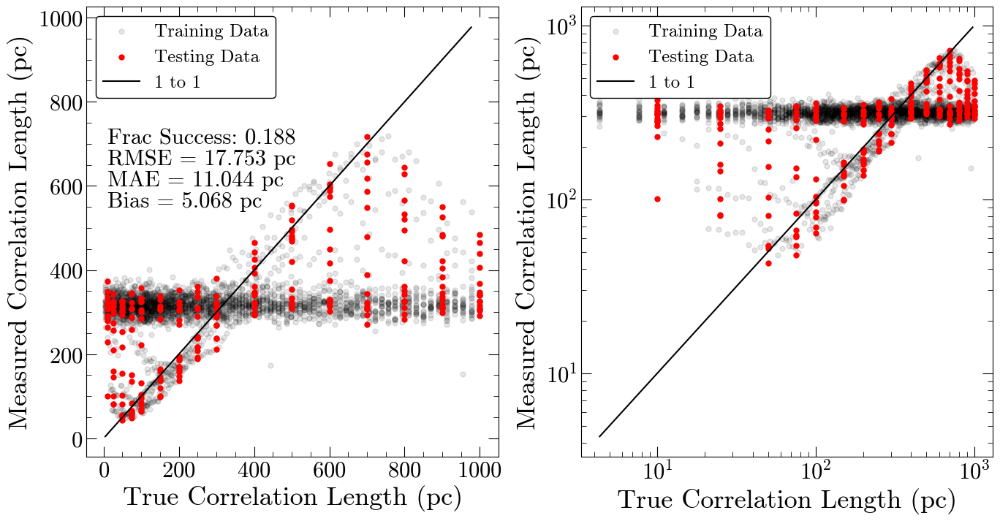

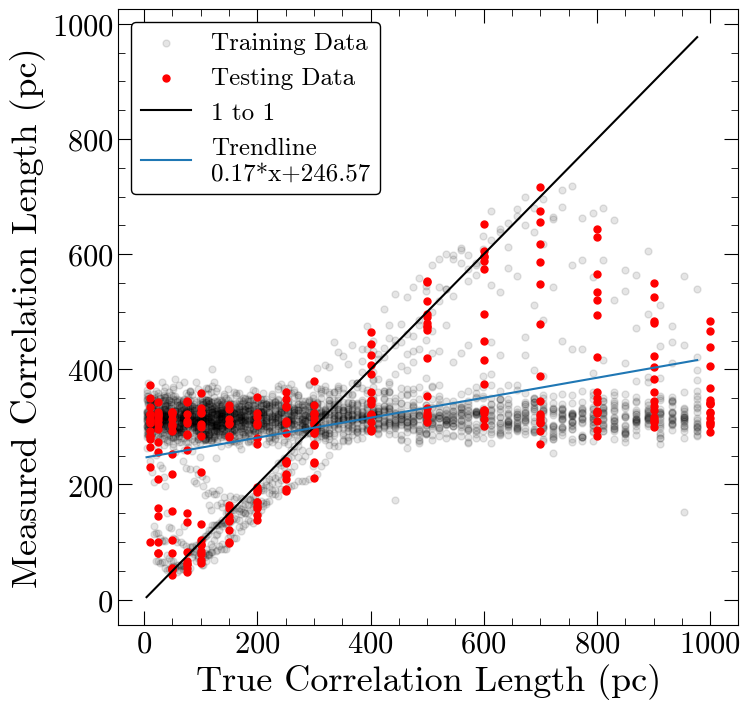

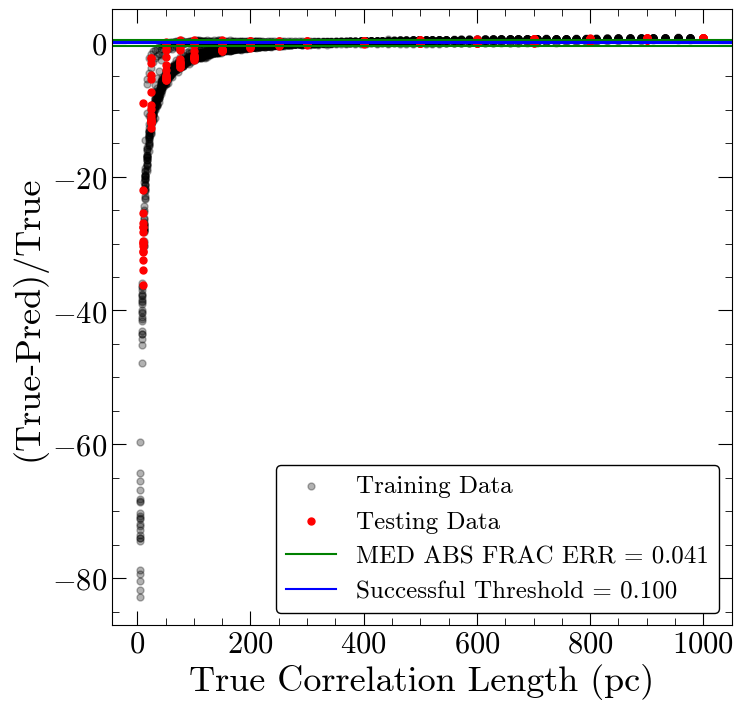

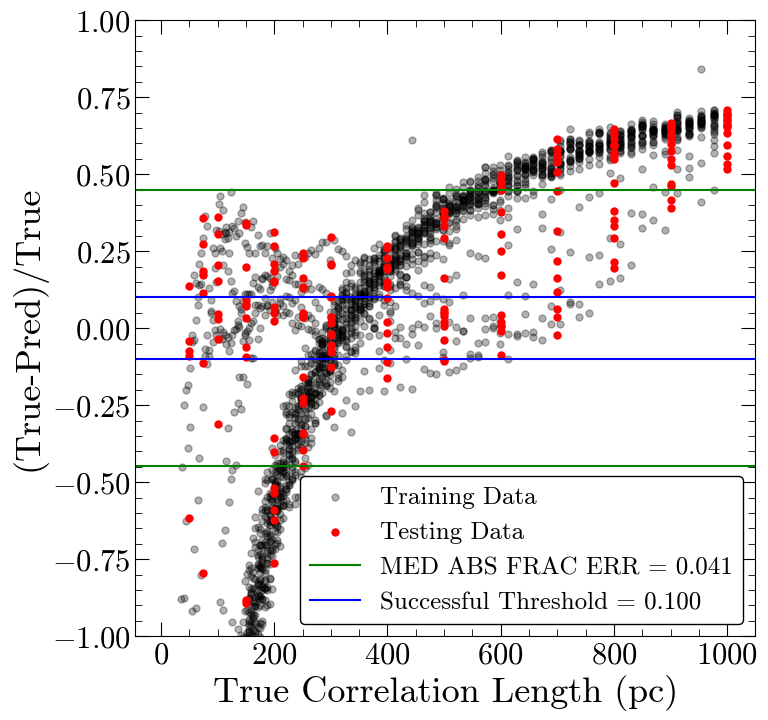

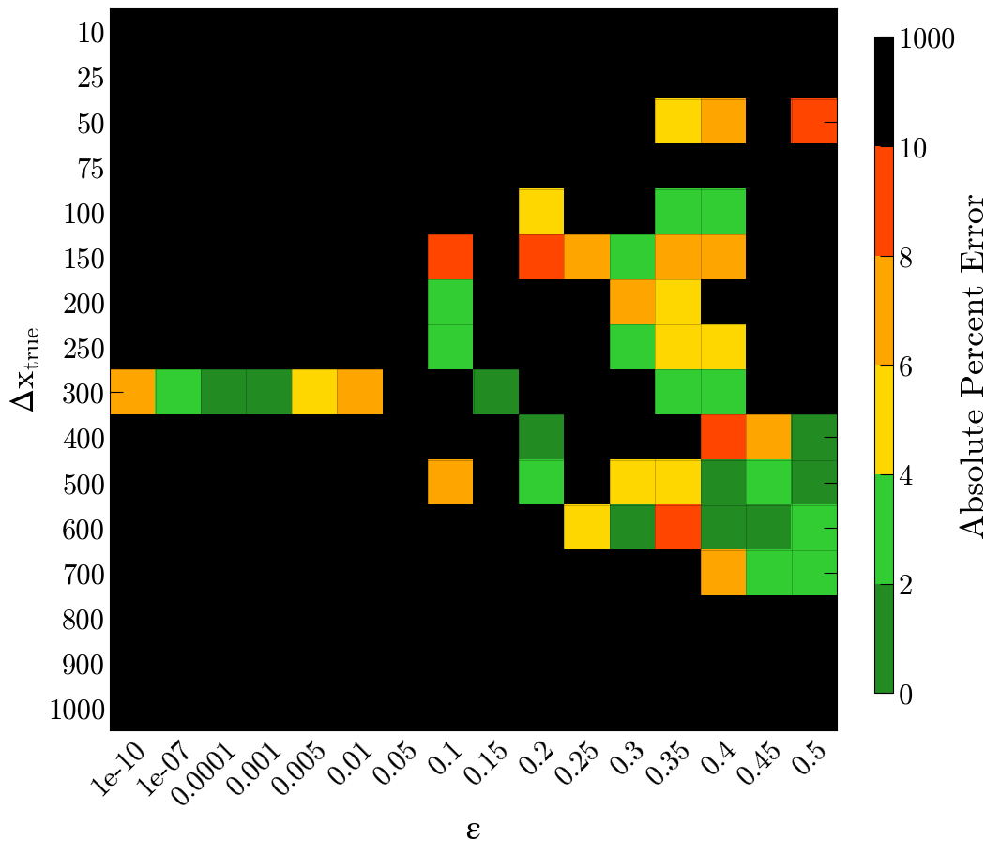

Number of squares with abs percent err>10%,  208


In [47]:
#model with more layers, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 1s 8ms/step - loss: 106532.7422
Epoch 2/200
92/92 [==============================] - 1s 8ms/step - loss: 68392.7422
Epoch 3/200
92/92 [==============================] - 1s 8ms/step - loss: 67130.8828
Epoch 4/200
92/92 [==============================] - 1s 7ms/step - loss: 67028.7422
Epoch 5/200
92/92 [==============================] - 1s 9ms/step - loss: 67058.9688
Epoch 6/200
92/92 [==============================] - 1s 8ms/step - loss: 67086.6953
Epoch 7/200
92/92 [==============================] - 1s 7ms/step - loss: 66871.9844
Epoch 8/200
92/92 [==============================] - 1s 8ms/step - loss: 66906.7500
Epoch 9/200
92/92 [==============================] - 1s 9ms/step - loss: 66538.4688
Epoch 10/200
92/92 [==============================] - 1s 7ms/step - loss: 66247.3438
Epoch 11/200
92/92 [==============================] - 1s 8ms/step - loss: 65824.4297
Epoch 12/200
92/92 [==============================] - 1s 7ms/step - loss:

92/92 [==============================] - 1s 8ms/step - loss: 59061.7617
Epoch 193/200
92/92 [==============================] - 1s 8ms/step - loss: 59241.8906
Epoch 194/200
92/92 [==============================] - 1s 8ms/step - loss: 58976.8555
Epoch 195/200
92/92 [==============================] - 1s 8ms/step - loss: 59040.3438
Epoch 196/200
92/92 [==============================] - 1s 8ms/step - loss: 59394.2031
Epoch 197/200
92/92 [==============================] - 1s 9ms/step - loss: 59243.9688
Epoch 198/200
92/92 [==============================] - 1s 9ms/step - loss: 59447.6289
Epoch 199/200
92/92 [==============================] - 1s 7ms/step - loss: 58931.2578
Epoch 200/200
92/92 [==============================] - 1s 8ms/step - loss: 59168.2734

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 242.931 pc
MAE: 179.064 pc
BIAS: -51.244 pc
MED FRAC ERR: 0.567 

Training Stats, Successful Fits
Frac Success Fit: 0.106 
RMSE: 22.186 pc
MAE: 16.690 pc
BIAS: 5.521 pc
MED FRAC ERR: 0.049 

Testing Stats
RMSE: 258.766 pc
MAE: 104.733 pc
BIAS: 15.868 pc
MED FRAC ERR: 0.452 

Testing Stats, Successful Fits
Frac Success Fit: 0.219 
RMSE: 30.730 pc
MAE: 20.926 pc
BIAS: 5.736 pc
MED FRAC ERR: 0.057 


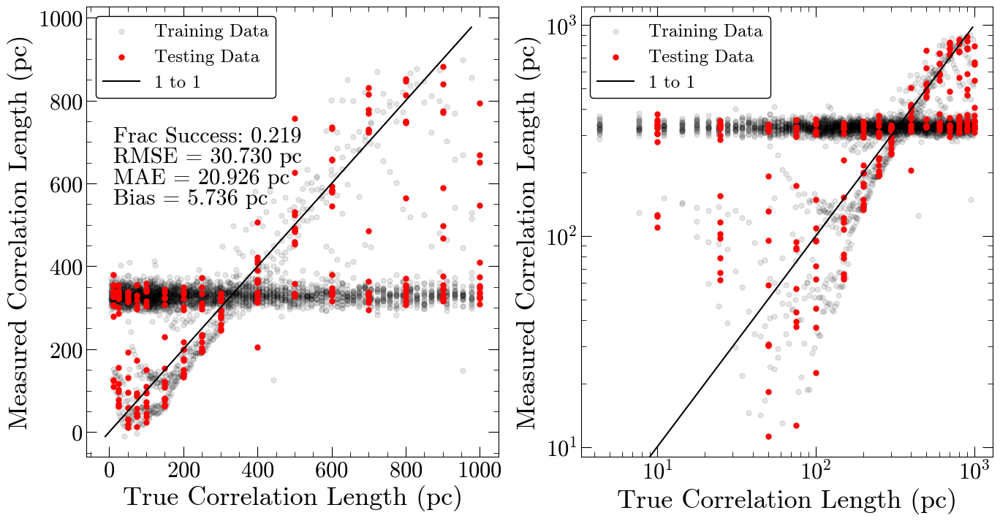

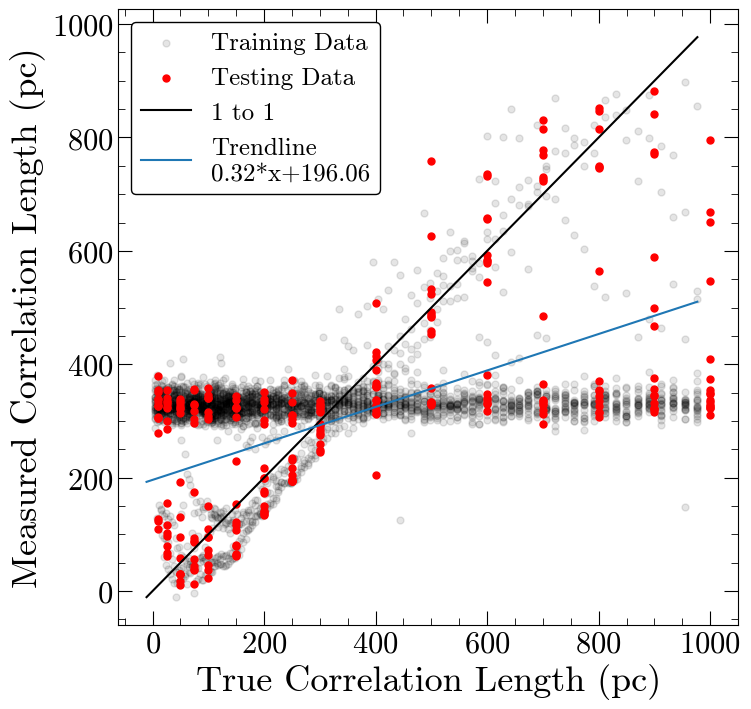

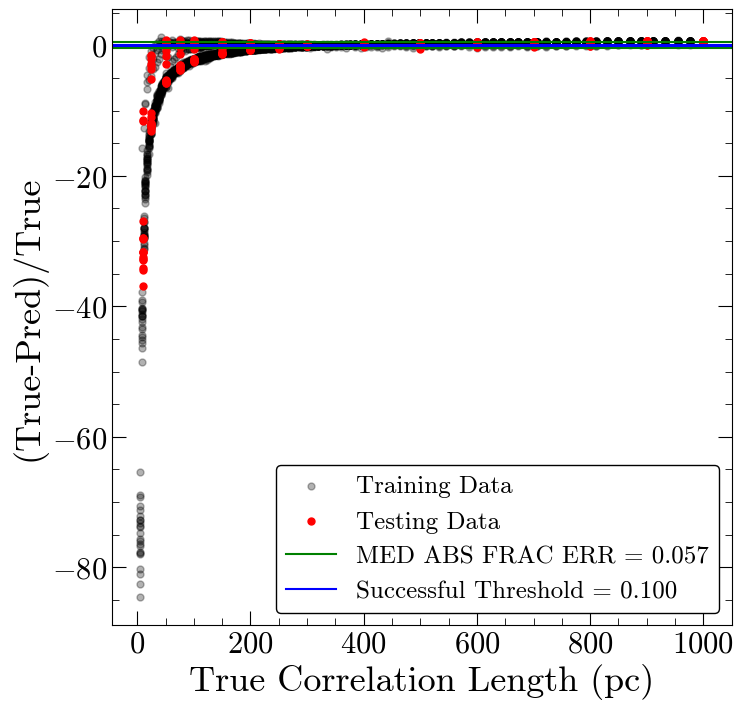

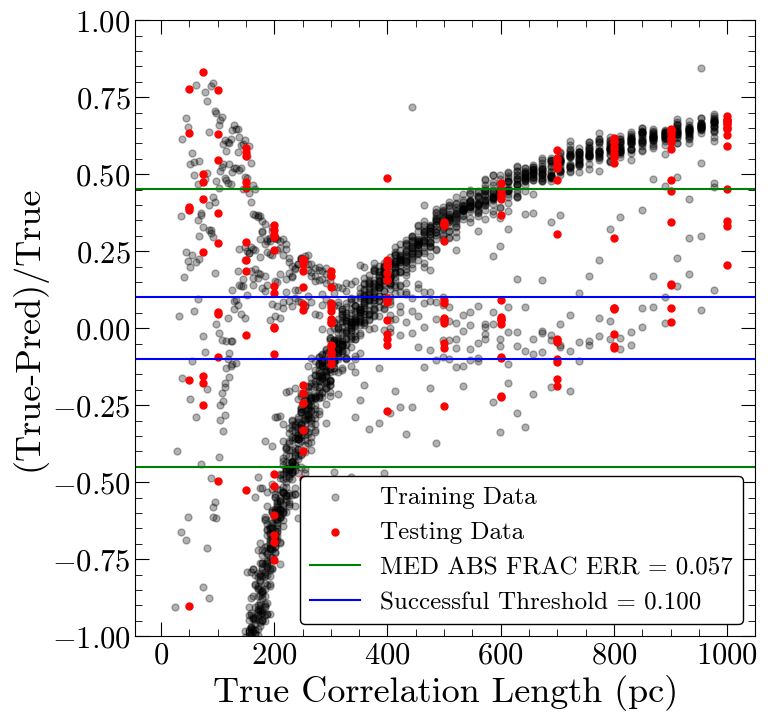

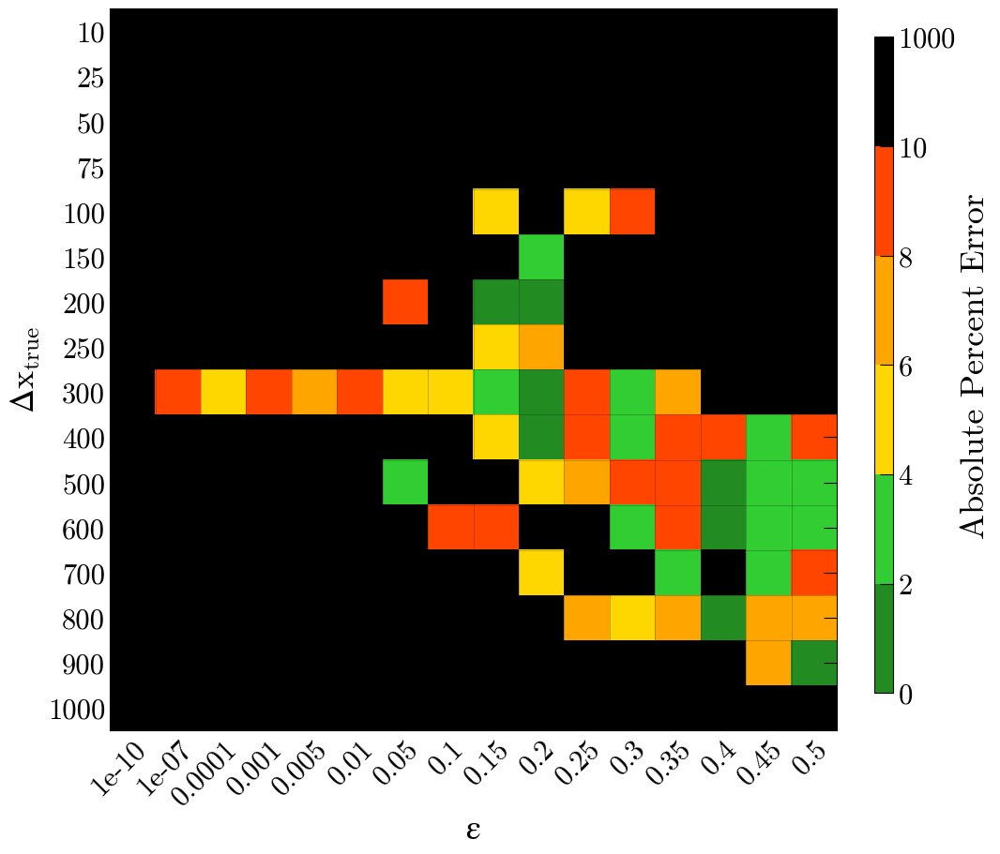

Number of squares with abs percent err>10%,  200


In [48]:
#model with more layers, run for more epochs, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 1s 10ms/step - loss: 103382.6016
Epoch 2/400
92/92 [==============================] - 1s 9ms/step - loss: 68179.6953
Epoch 3/400
92/92 [==============================] - 1s 10ms/step - loss: 66984.2578
Epoch 4/400
92/92 [==============================] - 1s 11ms/step - loss: 66456.3750
Epoch 5/400
92/92 [==============================] - 1s 10ms/step - loss: 66709.5547
Epoch 6/400
92/92 [==============================] - 1s 9ms/step - loss: 66461.1328
Epoch 7/400
92/92 [==============================] - 1s 9ms/step - loss: 66018.4297
Epoch 8/400
92/92 [==============================] - 1s 10ms/step - loss: 65860.9062
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 65480.3438
Epoch 10/400
92/92 [==============================] - 1s 10ms/step - loss: 65556.3438
Epoch 11/400
92/92 [==============================] - 1s 10ms/step - loss: 65738.8984
Epoch 12/400
92/92 [==============================] - 1s 10ms/ste

92/92 [==============================] - 1s 10ms/step - loss: 59825.0898
Epoch 191/400
92/92 [==============================] - 1s 12ms/step - loss: 59529.2305
Epoch 192/400
92/92 [==============================] - 1s 11ms/step - loss: 59464.0859
Epoch 193/400
92/92 [==============================] - 1s 10ms/step - loss: 59171.7539
Epoch 194/400
92/92 [==============================] - 1s 11ms/step - loss: 59383.2266
Epoch 195/400
92/92 [==============================] - 1s 12ms/step - loss: 59255.3828
Epoch 196/400
92/92 [==============================] - 1s 9ms/step - loss: 59379.0195
Epoch 197/400
92/92 [==============================] - 1s 9ms/step - loss: 59168.4922
Epoch 198/400
92/92 [==============================] - 1s 11ms/step - loss: 58995.8008
Epoch 199/400
92/92 [==============================] - 1s 10ms/step - loss: 59217.4023
Epoch 200/400
92/92 [==============================] - 1s 10ms/step - loss: 59044.8320
Epoch 201/400
92/92 [==============================] - 1s 1

92/92 [==============================] - 1s 10ms/step - loss: 58445.4766
Epoch 379/400
92/92 [==============================] - 1s 9ms/step - loss: 58244.3594
Epoch 380/400
92/92 [==============================] - 1s 11ms/step - loss: 57944.1289
Epoch 381/400
92/92 [==============================] - 1s 10ms/step - loss: 58239.6445
Epoch 382/400
92/92 [==============================] - 1s 11ms/step - loss: 58331.5781
Epoch 383/400
92/92 [==============================] - 1s 11ms/step - loss: 58696.5391
Epoch 384/400
92/92 [==============================] - 1s 10ms/step - loss: 58058.6367
Epoch 385/400
92/92 [==============================] - 1s 9ms/step - loss: 58138.6367
Epoch 386/400
92/92 [==============================] - 1s 12ms/step - loss: 58211.0625
Epoch 387/400
92/92 [==============================] - 1s 10ms/step - loss: 57901.7812
Epoch 388/400
92/92 [==============================] - 1s 10ms/step - loss: 58531.8789
Epoch 389/400
92/92 [==============================] - 1s 1

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 240.941 pc
MAE: 166.302 pc
BIAS: -29.936 pc
MED FRAC ERR: 0.541 

Training Stats, Successful Fits
Frac Success Fit: 0.174 
RMSE: 19.396 pc
MAE: 10.382 pc
BIAS: -0.945 pc
MED FRAC ERR: 0.042 

Testing Stats
RMSE: 252.474 pc
MAE: 94.949 pc
BIAS: -0.151 pc
MED FRAC ERR: 0.269 

Testing Stats, Successful Fits
Frac Success Fit: 0.320 
RMSE: 27.120 pc
MAE: 8.964 pc
BIAS: 0.625 pc
MED FRAC ERR: 0.044 


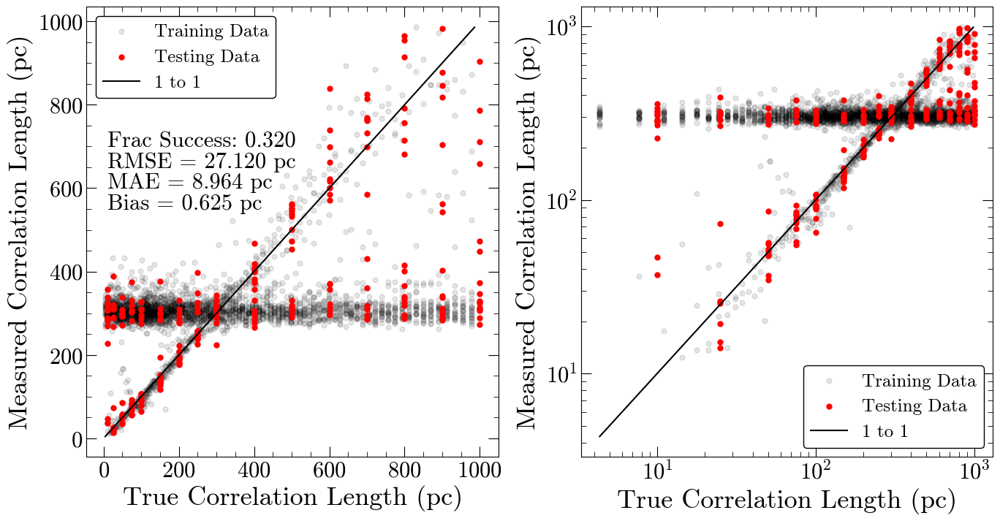

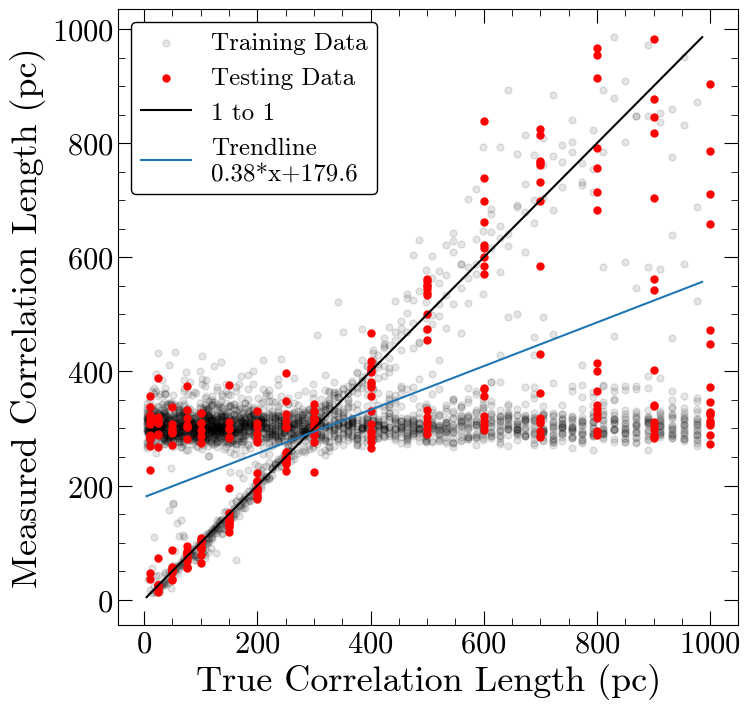

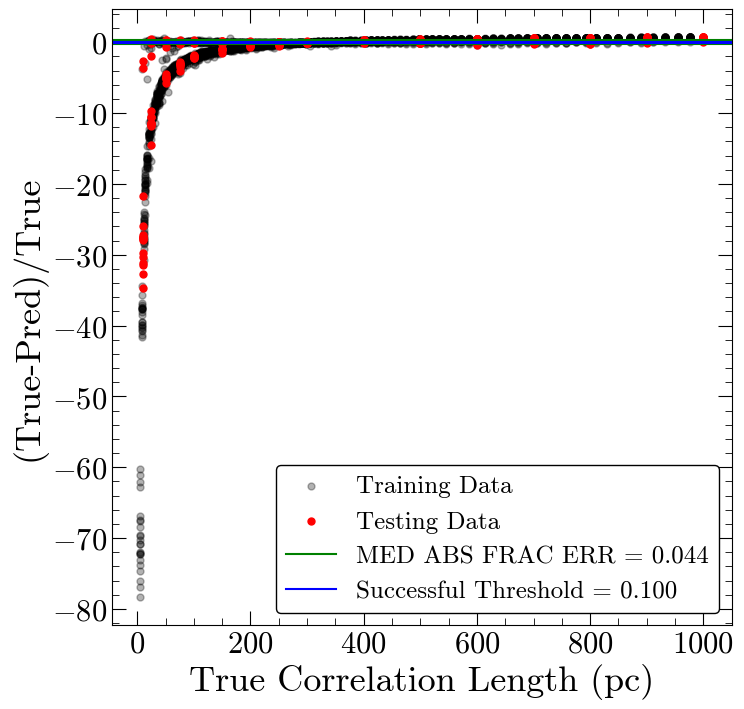

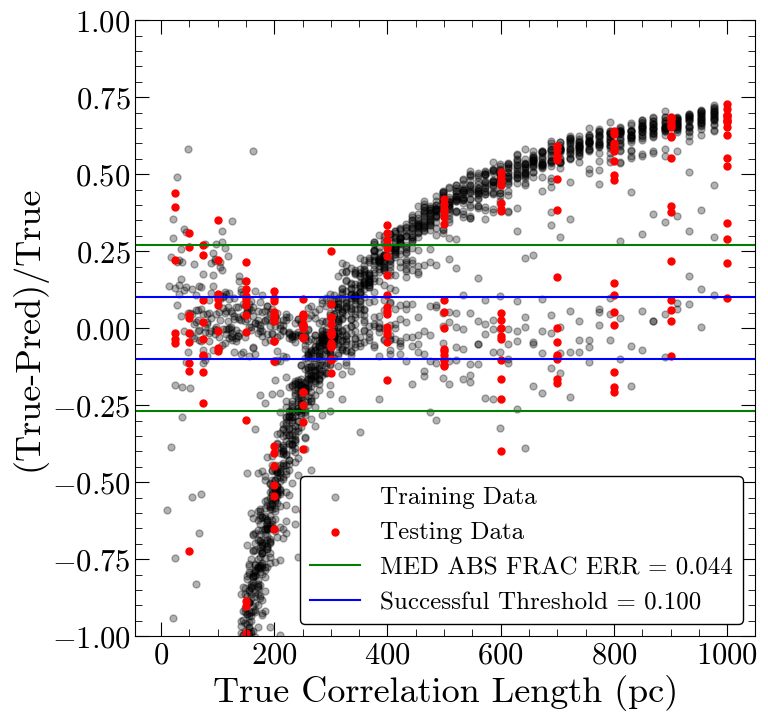

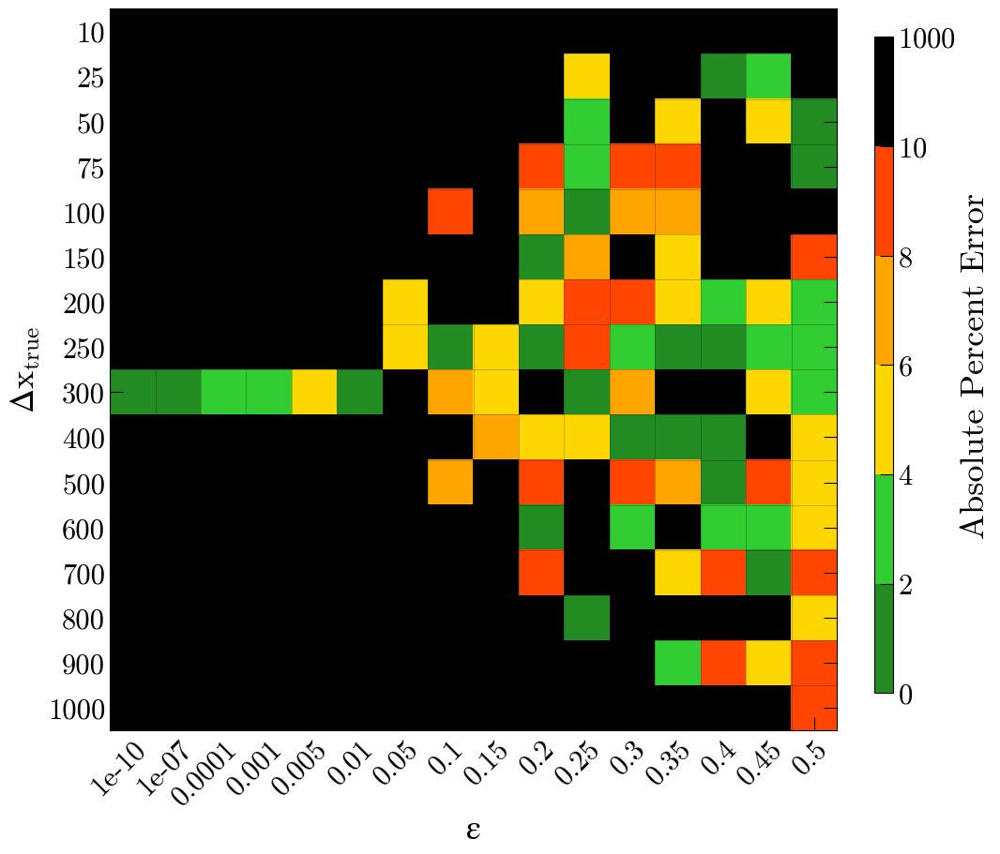

Number of squares with abs percent err>10%,  174


In [49]:
#model with more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 2s 10ms/step - loss: 110421.4844
Epoch 2/400
92/92 [==============================] - 1s 9ms/step - loss: 68092.5234
Epoch 3/400
92/92 [==============================] - 1s 11ms/step - loss: 67154.2109
Epoch 4/400
92/92 [==============================] - 1s 10ms/step - loss: 66843.1406
Epoch 5/400
92/92 [==============================] - 1s 11ms/step - loss: 66111.4844
Epoch 6/400
92/92 [==============================] - 1s 9ms/step - loss: 66059.7969
Epoch 7/400
92/92 [==============================] - 1s 11ms/step - loss: 66330.5078
Epoch 8/400
92/92 [==============================] - 1s 9ms/step - loss: 65775.8594
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 65339.0000
Epoch 10/400
92/92 [==============================] - 1s 10ms/step - loss: 65002.8906
Epoch 11/400
92/92 [==============================] - 1s 10ms/step - loss: 64877.7031
Epoch 12/400
92/92 [==============================] - 1s 9ms/step

92/92 [==============================] - 1s 10ms/step - loss: 60199.2422
Epoch 191/400
92/92 [==============================] - 1s 11ms/step - loss: 59623.8203
Epoch 192/400
92/92 [==============================] - 1s 10ms/step - loss: 58961.0898
Epoch 193/400
92/92 [==============================] - 1s 10ms/step - loss: 59256.2812
Epoch 194/400
92/92 [==============================] - 1s 9ms/step - loss: 59513.7109
Epoch 195/400
92/92 [==============================] - 1s 10ms/step - loss: 59085.3438
Epoch 196/400
92/92 [==============================] - 1s 11ms/step - loss: 58966.5195
Epoch 197/400
92/92 [==============================] - 1s 9ms/step - loss: 59315.5820
Epoch 198/400
92/92 [==============================] - 1s 11ms/step - loss: 59085.8984
Epoch 199/400
92/92 [==============================] - 1s 10ms/step - loss: 59679.0234
Epoch 200/400
92/92 [==============================] - 1s 11ms/step - loss: 59834.0586
Epoch 201/400
92/92 [==============================] - 1s 1

92/92 [==============================] - 1s 13ms/step - loss: 58031.4531
Epoch 379/400
92/92 [==============================] - 1s 12ms/step - loss: 58263.6836
Epoch 380/400
92/92 [==============================] - 1s 11ms/step - loss: 57849.7773
Epoch 381/400
92/92 [==============================] - 1s 10ms/step - loss: 58353.0781
Epoch 382/400
92/92 [==============================] - 1s 11ms/step - loss: 57998.9648
Epoch 383/400
92/92 [==============================] - 1s 10ms/step - loss: 58134.7148
Epoch 384/400
92/92 [==============================] - 1s 12ms/step - loss: 58274.5898
Epoch 385/400
92/92 [==============================] - 1s 11ms/step - loss: 58176.2305
Epoch 386/400
92/92 [==============================] - 1s 10ms/step - loss: 57977.4922
Epoch 387/400
92/92 [==============================] - 1s 11ms/step - loss: 57779.8086
Epoch 388/400
92/92 [==============================] - 1s 11ms/step - loss: 57702.5117
Epoch 389/400
92/92 [==============================] - 1s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 242.540 pc
MAE: 190.465 pc
BIAS: -59.454 pc
MED FRAC ERR: 0.532 

Training Stats, Successful Fits
Frac Success Fit: 0.166 
RMSE: 19.436 pc
MAE: 10.146 pc
BIAS: -2.698 pc
MED FRAC ERR: 0.036 

Testing Stats
RMSE: 245.138 pc
MAE: 76.665 pc
BIAS: -4.158 pc
MED FRAC ERR: 0.245 

Testing Stats, Successful Fits
Frac Success Fit: 0.316 
RMSE: 24.033 pc
MAE: 8.328 pc
BIAS: -0.434 pc
MED FRAC ERR: 0.040 


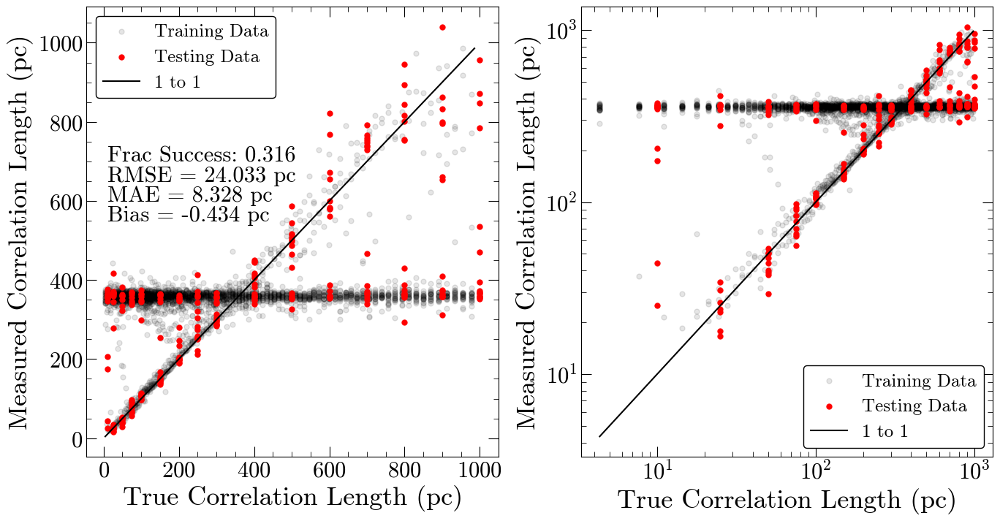

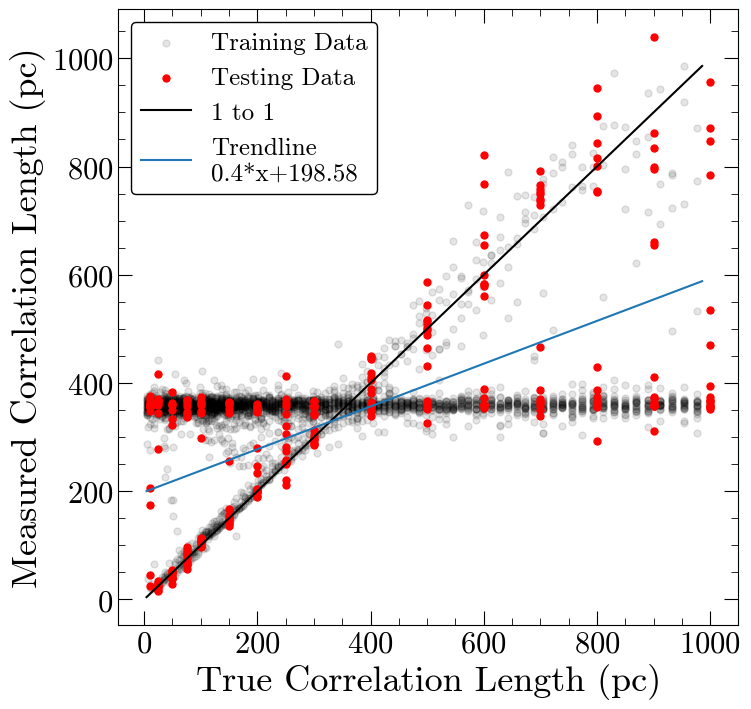

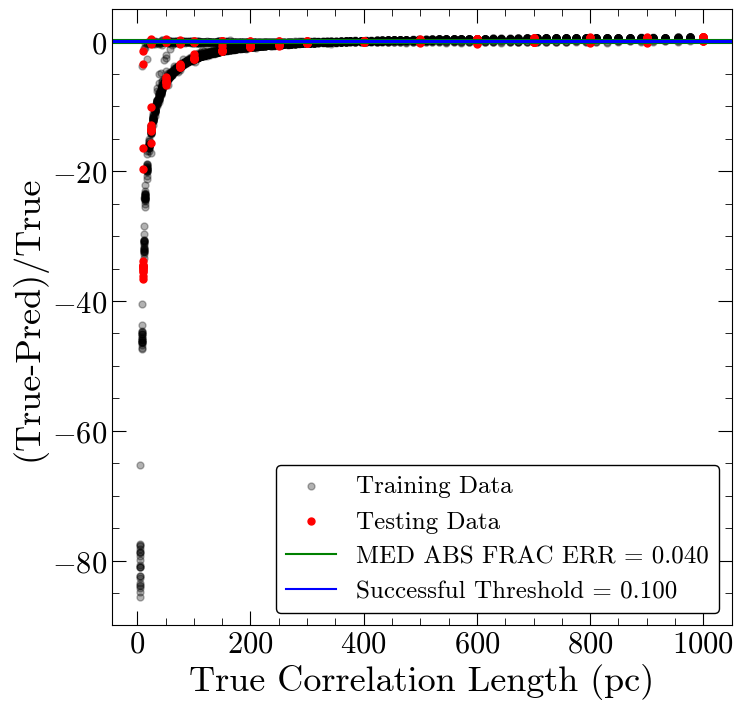

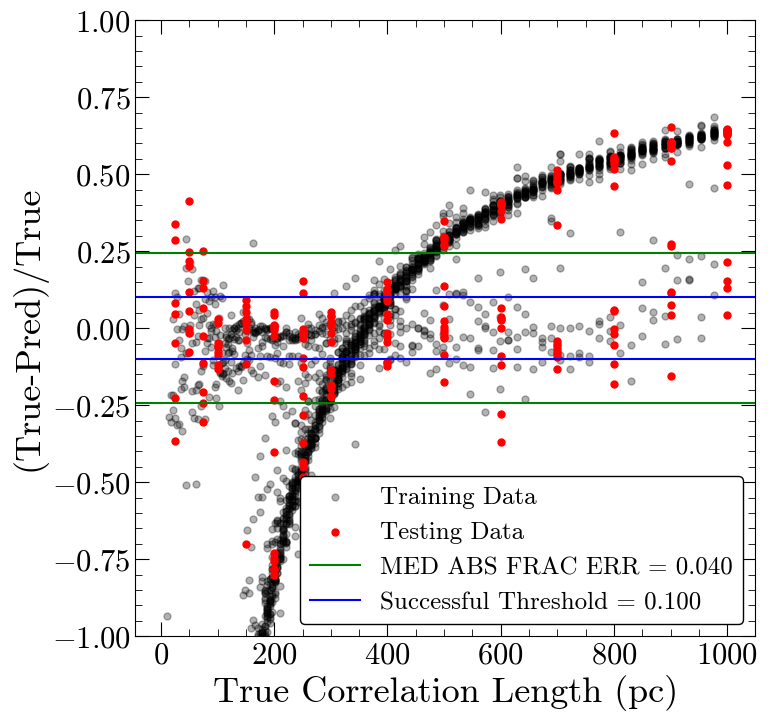

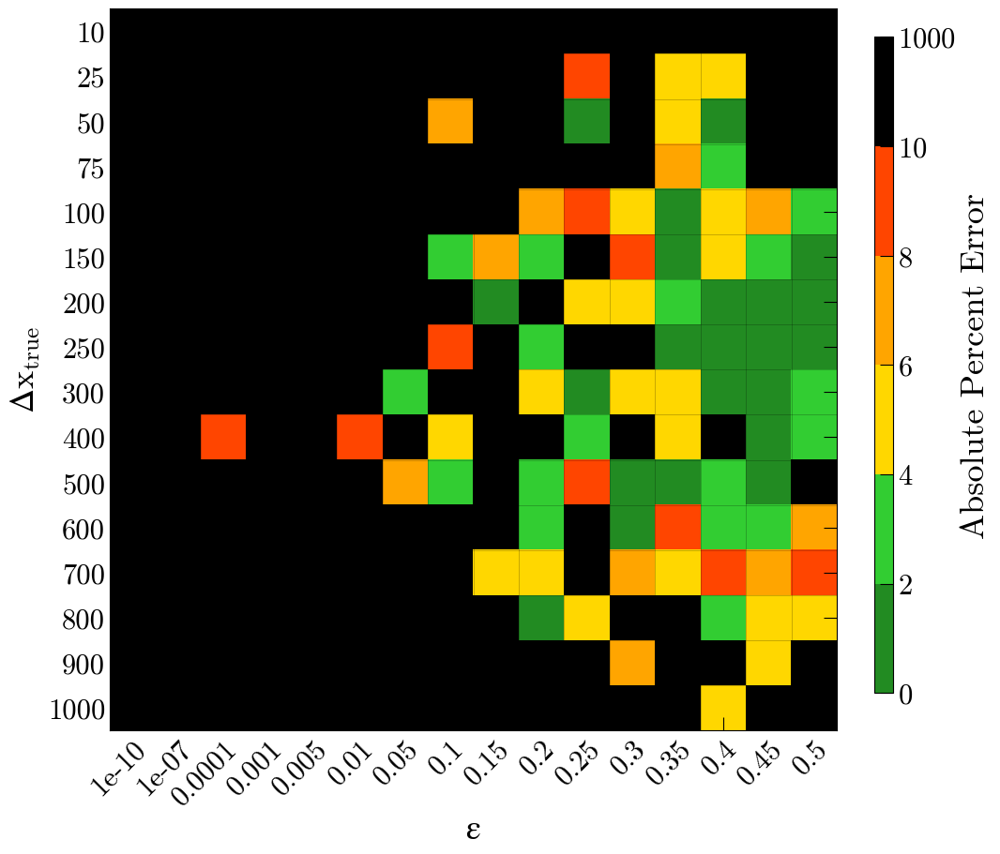

Number of squares with abs percent err>10%,  175


In [50]:
#model with even more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
46/46 [==============================] - 1s 14ms/step - loss: 137782.7969
Epoch 2/400
46/46 [==============================] - 1s 11ms/step - loss: 70463.4766
Epoch 3/400
46/46 [==============================] - 1s 14ms/step - loss: 67774.9453
Epoch 4/400
46/46 [==============================] - 1s 12ms/step - loss: 66762.7266
Epoch 5/400
46/46 [==============================] - 1s 12ms/step - loss: 66374.8672
Epoch 6/400
46/46 [==============================] - 1s 13ms/step - loss: 66334.7188
Epoch 7/400
46/46 [==============================] - 1s 14ms/step - loss: 66186.5312
Epoch 8/400
46/46 [==============================] - 1s 14ms/step - loss: 65980.1953
Epoch 9/400
46/46 [==============================] - 1s 13ms/step - loss: 65882.5859
Epoch 10/400
46/46 [==============================] - 1s 15ms/step - loss: 65534.5312
Epoch 11/400
46/46 [==============================] - 1s 15ms/step - loss: 64905.0430
Epoch 12/400
46/46 [==============================] - 1s 13ms/

46/46 [==============================] - 1s 14ms/step - loss: 59910.3008
Epoch 191/400
46/46 [==============================] - 1s 13ms/step - loss: 60123.3945
Epoch 192/400
46/46 [==============================] - 1s 14ms/step - loss: 59836.7578
Epoch 193/400
46/46 [==============================] - 1s 15ms/step - loss: 59333.9922
Epoch 194/400
46/46 [==============================] - 1s 12ms/step - loss: 59570.8594
Epoch 195/400
46/46 [==============================] - 1s 13ms/step - loss: 59650.5742
Epoch 196/400
46/46 [==============================] - 1s 12ms/step - loss: 59720.9727
Epoch 197/400
46/46 [==============================] - 1s 15ms/step - loss: 59588.1289
Epoch 198/400
46/46 [==============================] - 1s 14ms/step - loss: 59503.4961
Epoch 199/400
46/46 [==============================] - 1s 16ms/step - loss: 59181.4258
Epoch 200/400
46/46 [==============================] - 1s 15ms/step - loss: 59977.3438
Epoch 201/400
46/46 [==============================] - 1s

46/46 [==============================] - 1s 18ms/step - loss: 58218.0898
Epoch 379/400
46/46 [==============================] - 1s 20ms/step - loss: 58286.2188
Epoch 380/400
46/46 [==============================] - 1s 23ms/step - loss: 58003.1367
Epoch 381/400
46/46 [==============================] - 1s 19ms/step - loss: 58531.5859
Epoch 382/400
46/46 [==============================] - 1s 15ms/step - loss: 58497.2930
Epoch 383/400
46/46 [==============================] - 1s 15ms/step - loss: 58700.1055
Epoch 384/400
46/46 [==============================] - 1s 15ms/step - loss: 58206.0156
Epoch 385/400
46/46 [==============================] - 1s 16ms/step - loss: 58457.1797
Epoch 386/400
46/46 [==============================] - 1s 16ms/step - loss: 58317.6328
Epoch 387/400
46/46 [==============================] - 1s 16ms/step - loss: 59106.3594
Epoch 388/400
46/46 [==============================] - 1s 22ms/step - loss: 59389.4922
Epoch 389/400
46/46 [==============================] - 1s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 240.986 pc
MAE: 170.121 pc
BIAS: -25.296 pc
MED FRAC ERR: 0.535 

Training Stats, Successful Fits
Frac Success Fit: 0.188 
RMSE: 16.732 pc
MAE: 8.163 pc
BIAS: 3.585 pc
MED FRAC ERR: 0.037 

Testing Stats
RMSE: 257.572 pc
MAE: 90.903 pc
BIAS: 4.091 pc
MED FRAC ERR: 0.274 

Testing Stats, Successful Fits
Frac Success Fit: 0.340 
RMSE: 22.266 pc
MAE: 8.188 pc
BIAS: 2.359 pc
MED FRAC ERR: 0.036 


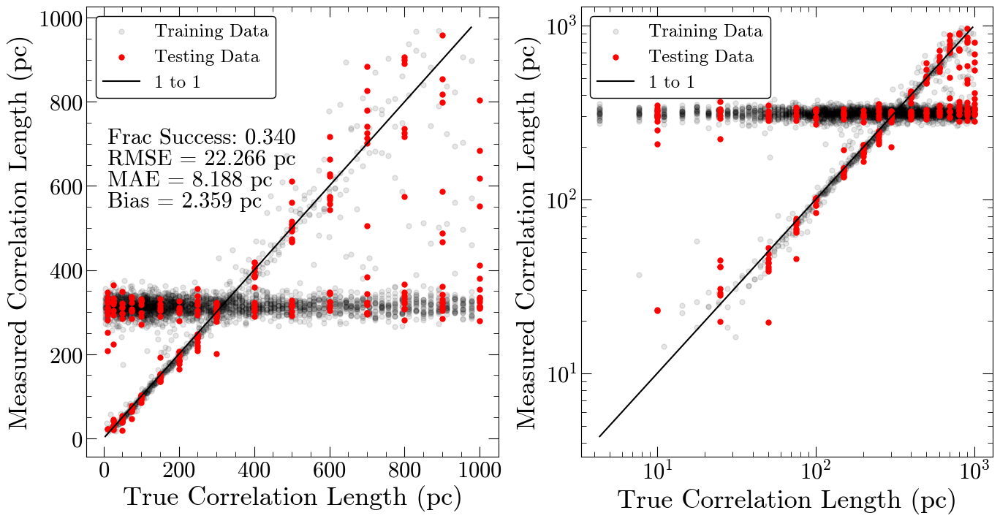

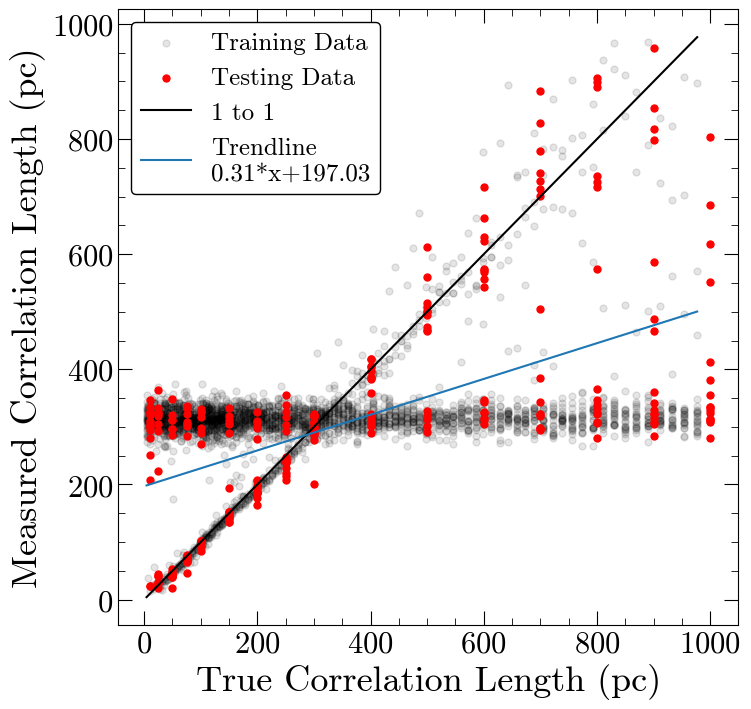

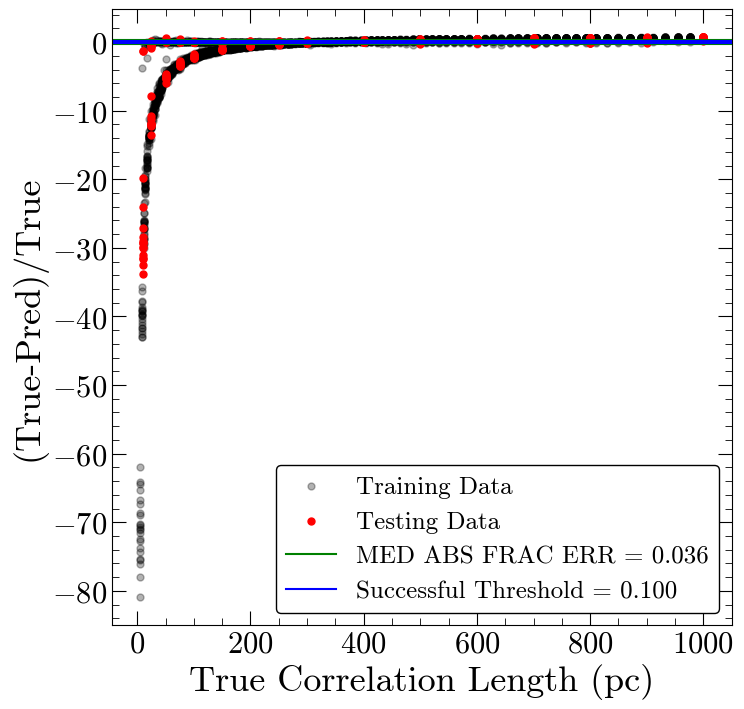

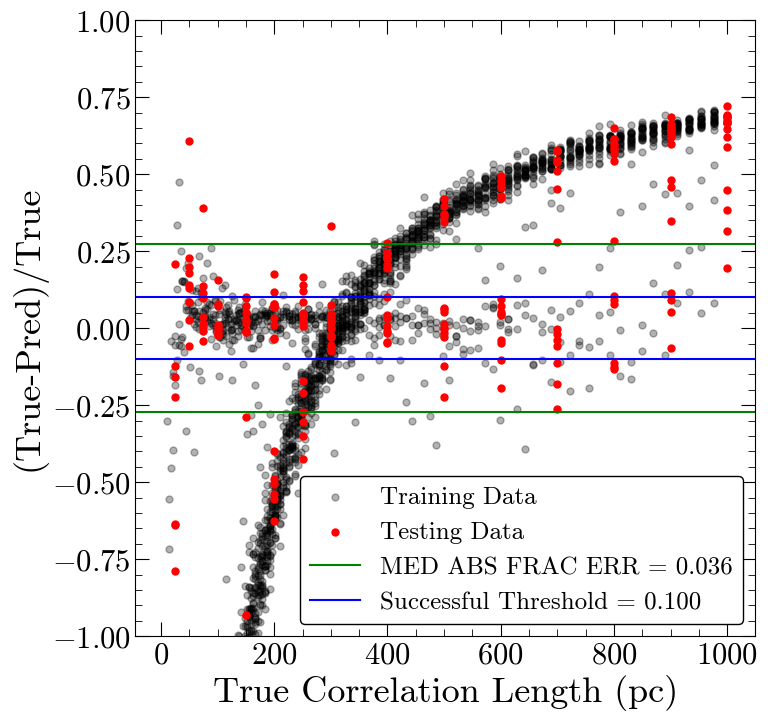

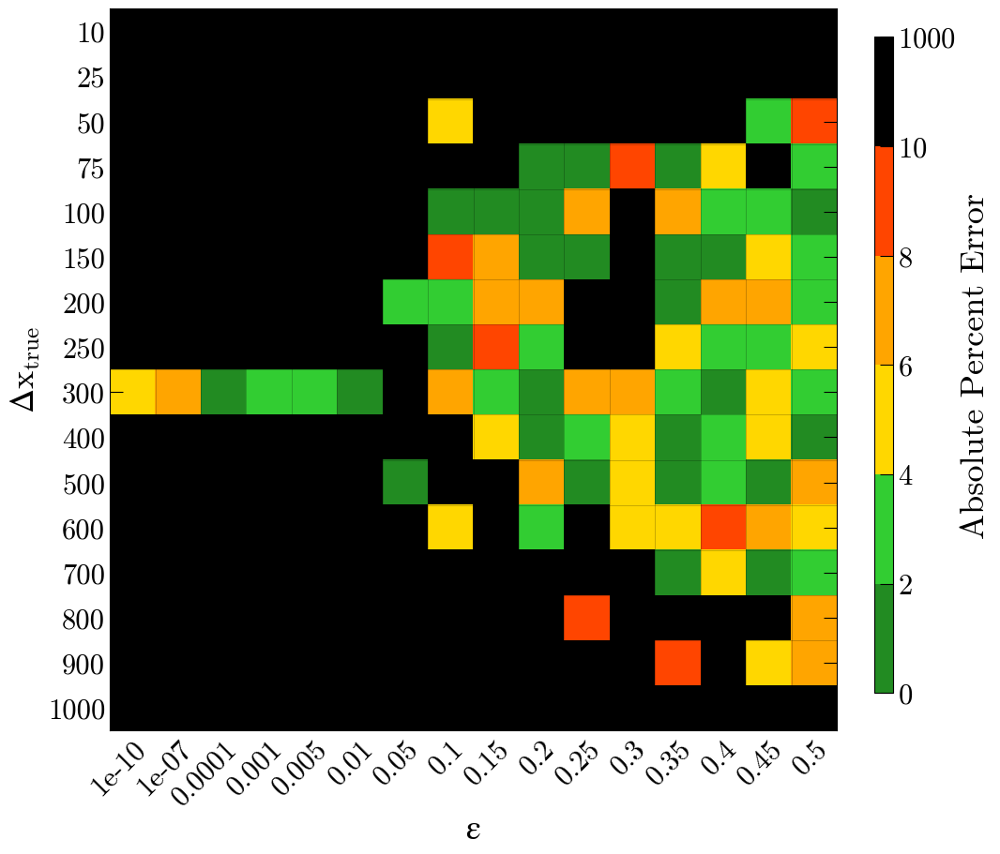

Number of squares with abs percent err>10%,  169


In [51]:
#model with even more layers, run for even more epochs, increase batch size
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=64)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
10/10 [==============================] - 1s 31ms/step - loss: 164373.5625
Epoch 2/400
10/10 [==============================] - 0s 32ms/step - loss: 163941.2500
Epoch 3/400
10/10 [==============================] - 0s 35ms/step - loss: 160065.3281
Epoch 4/400
10/10 [==============================] - 0s 23ms/step - loss: 136473.1250
Epoch 5/400
10/10 [==============================] - 0s 26ms/step - loss: 81980.2500
Epoch 6/400
10/10 [==============================] - 0s 28ms/step - loss: 75005.3984
Epoch 7/400
10/10 [==============================] - 0s 25ms/step - loss: 71775.0547
Epoch 8/400
10/10 [==============================] - 0s 26ms/step - loss: 69797.7266
Epoch 9/400
10/10 [==============================] - 0s 33ms/step - loss: 68943.8438
Epoch 10/400
10/10 [==============================] - 0s 23ms/step - loss: 68592.5312
Epoch 11/400
10/10 [==============================] - 0s 25ms/step - loss: 67981.7031
Epoch 12/400
10/10 [==============================] - 0s 26

10/10 [==============================] - 0s 27ms/step - loss: 61060.8047
Epoch 191/400
10/10 [==============================] - 0s 39ms/step - loss: 60971.7070
Epoch 192/400
10/10 [==============================] - 0s 23ms/step - loss: 61143.2539
Epoch 193/400
10/10 [==============================] - 0s 31ms/step - loss: 61234.7461
Epoch 194/400
10/10 [==============================] - 0s 36ms/step - loss: 61207.9531
Epoch 195/400
10/10 [==============================] - 0s 24ms/step - loss: 60847.6875
Epoch 196/400
10/10 [==============================] - 0s 47ms/step - loss: 60976.8828
Epoch 197/400
10/10 [==============================] - 0s 28ms/step - loss: 61033.0000
Epoch 198/400
10/10 [==============================] - 0s 46ms/step - loss: 60795.4883
Epoch 199/400
10/10 [==============================] - 0s 46ms/step - loss: 60853.1641
Epoch 200/400
10/10 [==============================] - 0s 22ms/step - loss: 61028.0156
Epoch 201/400
10/10 [==============================] - 0s

10/10 [==============================] - 0s 25ms/step - loss: 59659.4492
Epoch 379/400
10/10 [==============================] - 0s 22ms/step - loss: 59650.8711
Epoch 380/400
10/10 [==============================] - 0s 20ms/step - loss: 59287.3672
Epoch 381/400
10/10 [==============================] - 0s 21ms/step - loss: 59754.6250
Epoch 382/400
10/10 [==============================] - 0s 26ms/step - loss: 59691.2383
Epoch 383/400
10/10 [==============================] - 0s 22ms/step - loss: 60230.9492
Epoch 384/400
10/10 [==============================] - 0s 25ms/step - loss: 59833.4727
Epoch 385/400
10/10 [==============================] - 0s 22ms/step - loss: 59189.5430
Epoch 386/400
10/10 [==============================] - 0s 21ms/step - loss: 59489.9453
Epoch 387/400
10/10 [==============================] - 0s 23ms/step - loss: 59035.4922
Epoch 388/400
10/10 [==============================] - 0s 27ms/step - loss: 59316.4219
Epoch 389/400
10/10 [==============================] - 0s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 242.735 pc
MAE: 164.172 pc
BIAS: -29.352 pc
MED FRAC ERR: 0.548 

Training Stats, Successful Fits
Frac Success Fit: 0.169 
RMSE: 18.027 pc
MAE: 10.341 pc
BIAS: 0.197 pc
MED FRAC ERR: 0.039 

Testing Stats
RMSE: 262.438 pc
MAE: 102.102 pc
BIAS: -0.194 pc
MED FRAC ERR: 0.383 

Testing Stats, Successful Fits
Frac Success Fit: 0.305 
RMSE: 22.815 pc
MAE: 8.295 pc
BIAS: 2.022 pc
MED FRAC ERR: 0.039 


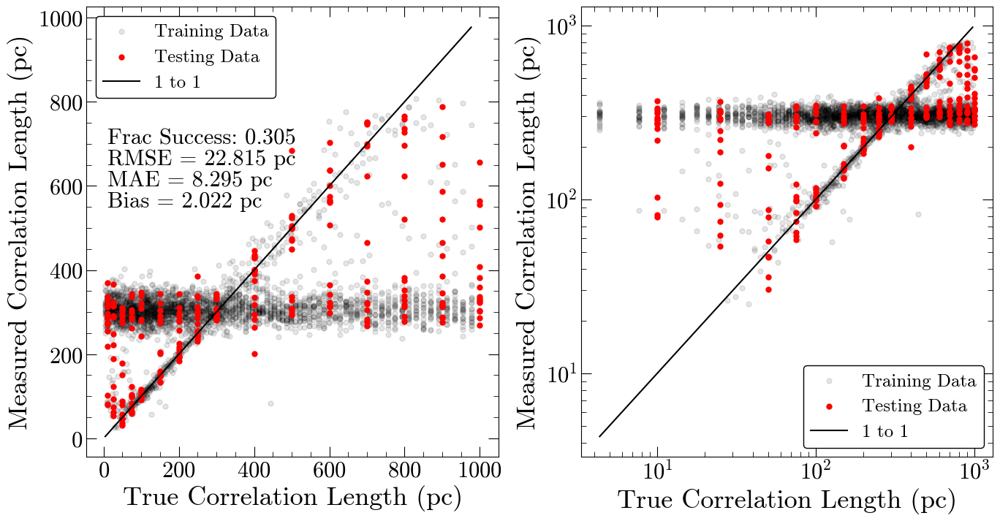

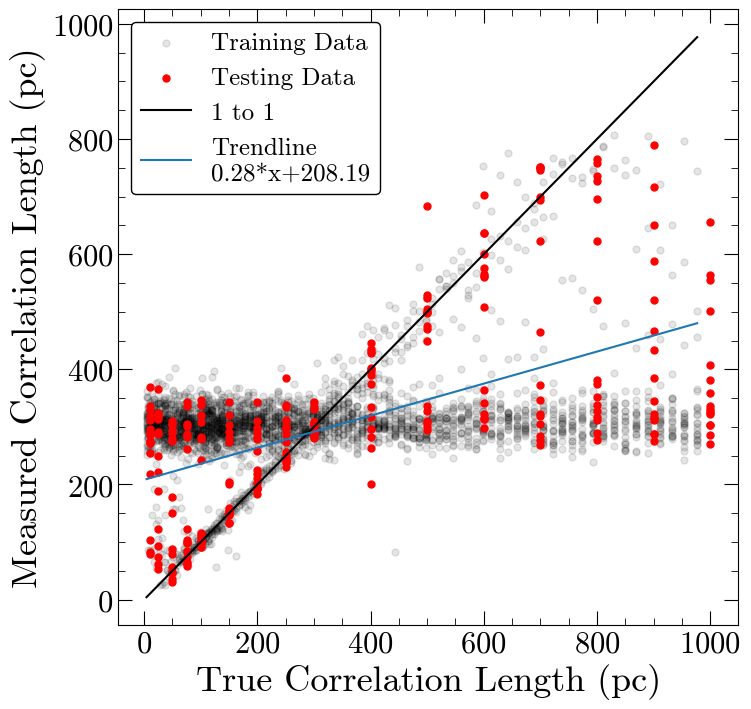

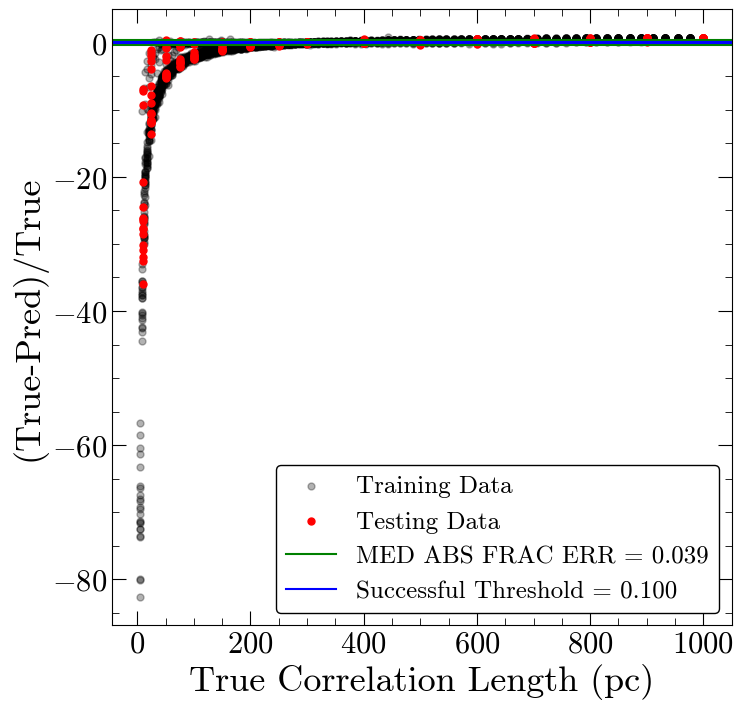

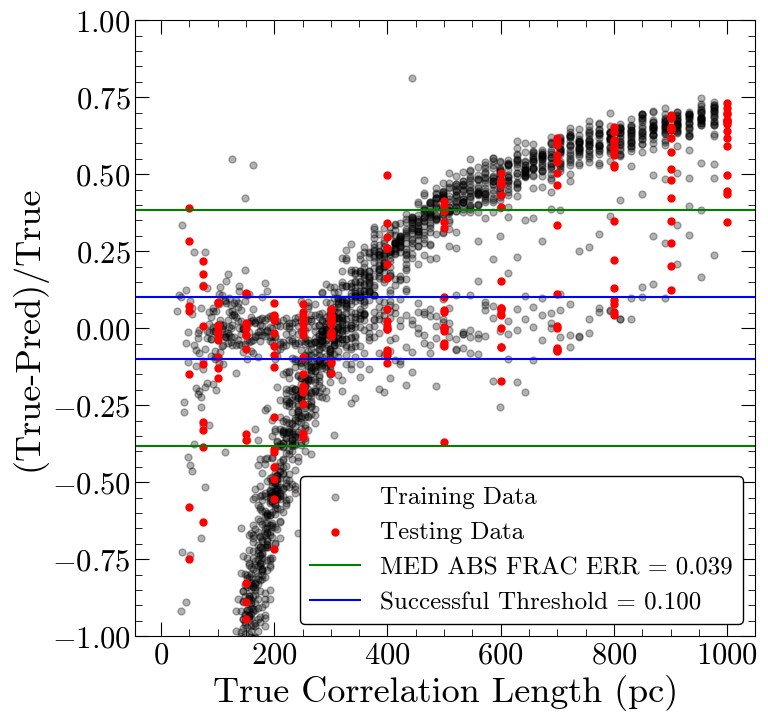

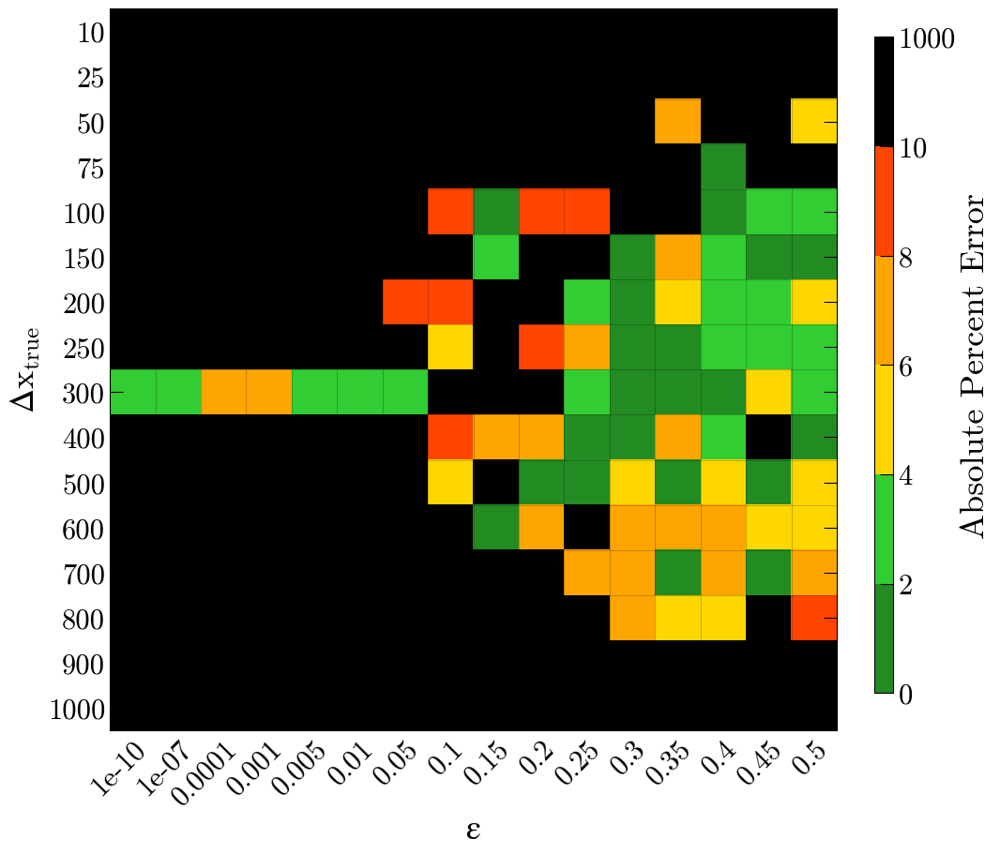

Number of squares with abs percent err>10%,  178


In [52]:
#model with even more layers, run for even more epochs, increase batch size even more
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=300)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

# Save best model

In [53]:
#reset the indices
indices=np.arange(0,len(all_model_stats))
all_model_stats.set_index(indices,inplace=True)
#round all values
all_model_stats=all_model_stats.round(2)

print('Min MAE Training')
print(all_model_stats['mae_training'].idxmin(),', min val=',min(all_model_stats['mae_training']))
print('')

print('Max Frac Success Training')
print(all_model_stats['frac_success_training'].idxmax(),', max val=',max(all_model_stats['frac_success_training']))
print('')

print('Min MAE Testing')
print(all_model_stats['mae_testing'].idxmin(),', min val=',min(all_model_stats['mae_testing']))
print('')

print('Max Frac Success Testing')
print(all_model_stats['frac_success_testing'].idxmax(),', max val=',max(all_model_stats['frac_success_testing']))
print('')

display(all_model_stats)

#best model options are 8 or 9


Min MAE Training
3 , min val= 149.04

Max Frac Success Training
9 , max val= 0.19

Min MAE Testing
8 , min val= 76.66

Max Frac Success Testing
9 , max val= 0.34



,mae_training,frac_success_training,mae_testing,frac_success_testing
0,174.55,0.11,183.58,0.17
1,184.97,0.15,146.44,0.25
2,185.89,0.12,148.57,0.21
3,149.04,0.14,83.94,0.25
4,187.38,0.11,146.21,0.17
5,175.62,0.11,151.51,0.19
6,179.06,0.11,104.73,0.22
7,166.30,0.17,94.95,0.32
8,190.47,0.17,76.66,0.32
9,170.12,0.19,90.90,0.34


In [61]:
#choose model 8 which is the best option across all runs

failed_fit_region_count=500

while failed_fit_region_count>175:
    #model with even more layers, run for even more epochs
    final_model = Sequential([
        Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
        MaxPooling1D(2), 
        Conv1D(64, 3, activation='relu'),
        MaxPooling1D(2), 
        Conv1D(128, 3, activation='relu'), 
        MaxPooling1D(2), 
        Flatten(), 
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1) 
    ])

    final_model.compile(optimizer='adam', loss='mse')

    final_model.fit(x_train, y_train, epochs=400, batch_size=32)

    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(final_model,stats=False,plot=False)
    
    print('')
    print(failed_fit_region_count)
    print('')

Epoch 1/400
92/92 [==============================] - 1s 4ms/step - loss: 112428.1641
Epoch 2/400
92/92 [==============================] - 0s 4ms/step - loss: 68315.6406
Epoch 3/400
92/92 [==============================] - 0s 4ms/step - loss: 67085.6016
Epoch 4/400
92/92 [==============================] - 0s 4ms/step - loss: 66381.9219
Epoch 5/400
92/92 [==============================] - 0s 4ms/step - loss: 66398.1016
Epoch 6/400
92/92 [==============================] - 0s 4ms/step - loss: 65961.4062
Epoch 7/400
92/92 [==============================] - 0s 4ms/step - loss: 65654.5938
Epoch 8/400
92/92 [==============================] - 0s 4ms/step - loss: 65873.0234
Epoch 9/400
92/92 [==============================] - 0s 4ms/step - loss: 65272.5391
Epoch 10/400
92/92 [==============================] - 0s 4ms/step - loss: 65008.9570
Epoch 11/400
92/92 [==============================] - 0s 4ms/step - loss: 64987.0430
Epoch 12/400
92/92 [==============================] - 0s 4ms/step - loss:

92/92 [==============================] - 1s 10ms/step - loss: 59125.7773
Epoch 193/400
92/92 [==============================] - 1s 10ms/step - loss: 59081.3984
Epoch 194/400
92/92 [==============================] - 1s 10ms/step - loss: 58682.7695
Epoch 195/400
92/92 [==============================] - 1s 11ms/step - loss: 59332.7266
Epoch 196/400
92/92 [==============================] - 1s 9ms/step - loss: 58973.5859
Epoch 197/400
92/92 [==============================] - 1s 9ms/step - loss: 58805.6758
Epoch 198/400
92/92 [==============================] - 1s 9ms/step - loss: 58605.6602
Epoch 199/400
92/92 [==============================] - 1s 14ms/step - loss: 58592.2617
Epoch 200/400
92/92 [==============================] - 1s 13ms/step - loss: 58672.0039
Epoch 201/400
92/92 [==============================] - 1s 9ms/step - loss: 58437.8828
Epoch 202/400
92/92 [==============================] - 1s 10ms/step - loss: 59089.0117
Epoch 203/400
92/92 [==============================] - 1s 11m

92/92 [==============================] - 1s 12ms/step - loss: 58198.4414
Epoch 381/400
92/92 [==============================] - 1s 14ms/step - loss: 58013.9570
Epoch 382/400
92/92 [==============================] - 1s 14ms/step - loss: 58067.0820
Epoch 383/400
92/92 [==============================] - 1s 16ms/step - loss: 58245.0391
Epoch 384/400
92/92 [==============================] - 2s 20ms/step - loss: 58035.2383
Epoch 385/400
92/92 [==============================] - 1s 16ms/step - loss: 58160.3711
Epoch 386/400
92/92 [==============================] - 1s 15ms/step - loss: 58319.2266
Epoch 387/400
92/92 [==============================] - 1s 13ms/step - loss: 57991.9102
Epoch 388/400
92/92 [==============================] - 1s 15ms/step - loss: 57827.5156
Epoch 389/400
92/92 [==============================] - 1s 15ms/step - loss: 57901.1914
Epoch 390/400
92/92 [==============================] - 2s 17ms/step - loss: 58081.8828
Epoch 391/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 14ms/step - loss: 58215.8828
Epoch 170/400
92/92 [==============================] - 1s 13ms/step - loss: 58593.2500
Epoch 171/400
92/92 [==============================] - 1s 13ms/step - loss: 58512.3398
Epoch 172/400
92/92 [==============================] - 1s 13ms/step - loss: 58478.1719
Epoch 173/400
92/92 [==============================] - 1s 15ms/step - loss: 58271.3477
Epoch 174/400
92/92 [==============================] - 1s 12ms/step - loss: 59036.3672
Epoch 175/400
92/92 [==============================] - 1s 12ms/step - loss: 59412.7109
Epoch 176/400
92/92 [==============================] - 1s 12ms/step - loss: 58783.4688
Epoch 177/400
92/92 [==============================] - 1s 12ms/step - loss: 58533.1328
Epoch 178/400
92/92 [==============================] - 1s 12ms/step - loss: 59300.7383
Epoch 179/400
92/92 [==============================] - 1s 12ms/step - loss: 58663.7773
Epoch 180/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 11ms/step - loss: 57873.5273
Epoch 358/400
92/92 [==============================] - 1s 10ms/step - loss: 57841.9922
Epoch 359/400
92/92 [==============================] - 1s 11ms/step - loss: 57932.4844
Epoch 360/400
92/92 [==============================] - 1s 10ms/step - loss: 57668.0547
Epoch 361/400
92/92 [==============================] - 1s 12ms/step - loss: 57946.2539
Epoch 362/400
92/92 [==============================] - 1s 11ms/step - loss: 58096.8477
Epoch 363/400
92/92 [==============================] - 1s 11ms/step - loss: 58368.1484
Epoch 364/400
92/92 [==============================] - 1s 11ms/step - loss: 57940.6836
Epoch 365/400
92/92 [==============================] - 1s 10ms/step - loss: 58187.2461
Epoch 366/400
92/92 [==============================] - 1s 12ms/step - loss: 58433.7969
Epoch 367/400
92/92 [==============================] - 1s 10ms/step - loss: 57935.2227
Epoch 368/400
92/92 [==============================] - 1s

In [62]:
#save the model
nb='02'
final_model.save('csv/nb05_sample_size_10207/'+nb+'_final_model')

INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/02_final_model/assets


INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/02_final_model/assets


In [65]:
def final_plot(nb,title,statx=10,staty=700,statdy=50,lim='default', siegel=True,success_fit_threshold=0.1):
    
    loaded_model = load_model('csv/nb05_sample_size_10207/'+nb+'_final_model')
    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(loaded_model,stats=False,plot=False)
    
    # use the model to predict the training data
    y_pred_train = loaded_model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the training data
    y_pred_test = loaded_model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,False)
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,False,True,success_fit_threshold)
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,False)
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold)
    
    #plot the agreement with stats
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(8,16),sharex=True)
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_ylabel(r'Predicted Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    
    # plot the fractional error between the datasets zoomed in
    ax2.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax2.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax2.axhline(0,color='black')
    ax2.axhline(med_frac_testing,color='green',label='Median Absolute\nFractional Error = {:.3f}'.format(med_frac_testing_success))
    ax2.axhline(-med_frac_testing,color='green')
    ax2.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.1f}'.format(success_fit_threshold))
    ax2.axhline(-success_fit_threshold,color='blue')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'($\lambda_{True}-\lambda_{Pred})/\lambda_{True}$')
    ax2.set_ylim((-1,1))
    ax2.legend()
    
    ax1.set_title(title)
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    plt.show()
    
    #make and save the heatmap, which is the figure that will be included in the paper
    failed_fit_region_count=heatmap_testing_data(testing_data,title,savefig=True,figname=nb+'_cnn_heatmap')
    

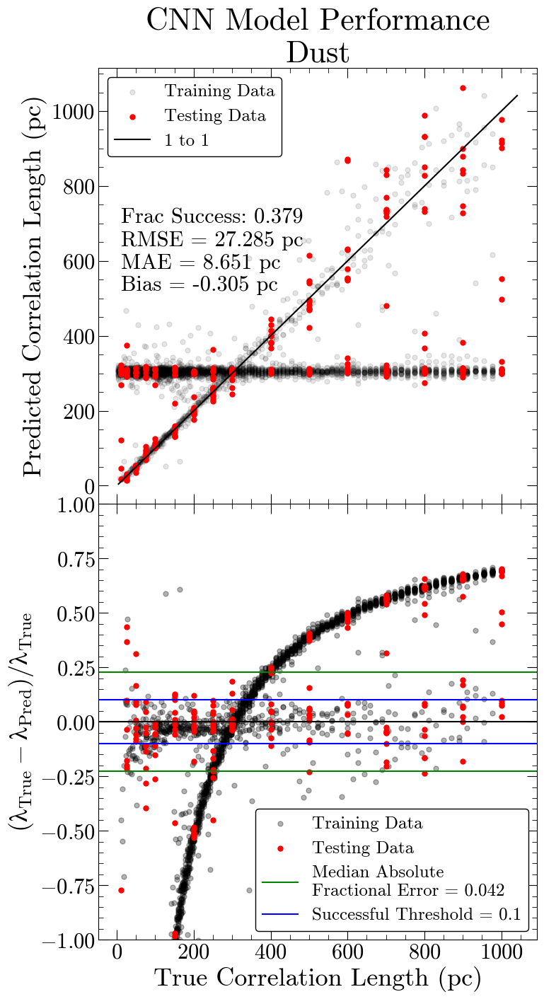

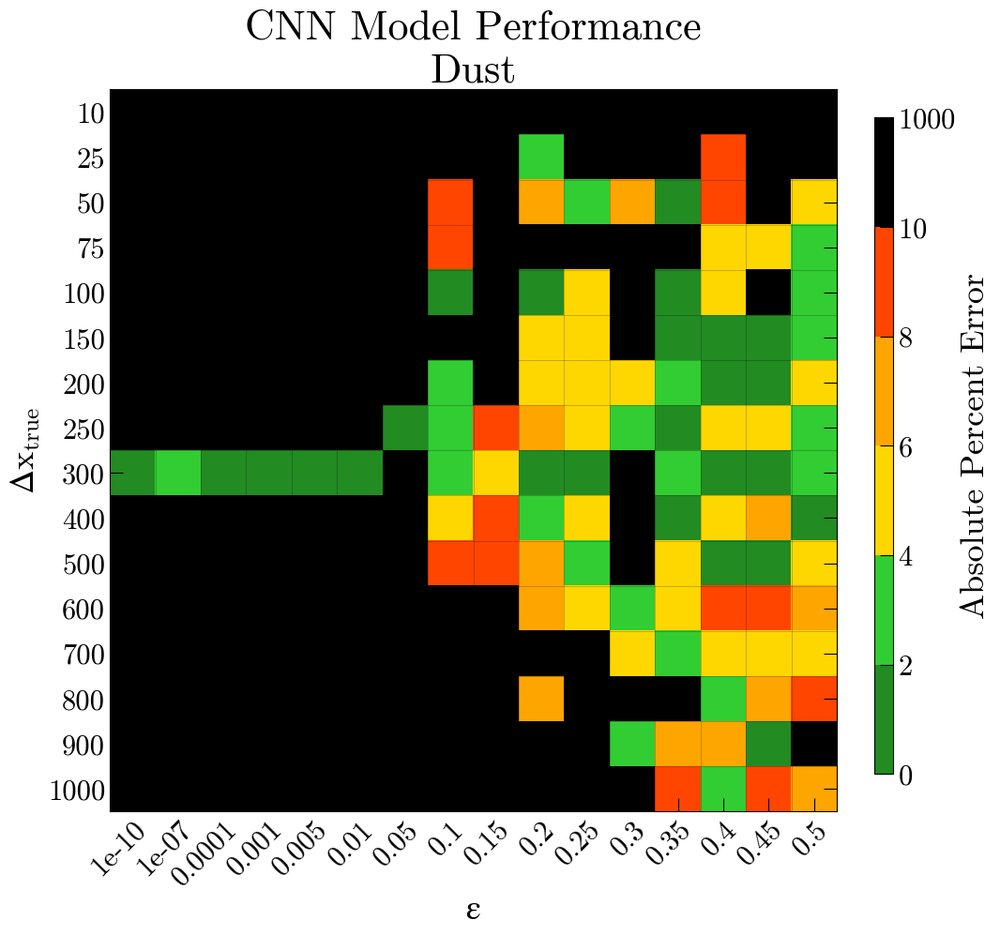

Number of squares with abs percent err>10%,  159


In [66]:
final_plot('02','CNN Model Performance\nDust',statdy=60)